# Data-driven Insights and Sales Prediction for an Online Retail Store

Mable MarketPlace is an online retail store that operates mainly in South Africa and has recently started business internationally. It can be assumed that the data and historic information on the clients was gathered randomly and independently. Data analysis, feature engineering, and regression models are used to build a predictive model to optimize sales. 

## Import libraries and dataset

In [3]:
pip install mlxtend

#### Environment Setup and Dependency Management: Fixing Numpy Compatibility Issues

Older modules compiled using Numpy 1 are incompatible with Numpy 2. If your environment is running Numpy 2, attempting to import the libraries in this notebook will produce an error. Uncomment and run the following statements to fix the issue.

In [4]:
#import sys
#!{sys.executable} -m pip install numpy==1.26.4 --force-reinstall --no-cache-dir

If the installation of Numpy 1.26.4 gives a Numba warning, either ignore as it does not affect this notebook or uninstall Numba. The following step is optional and not a necessity.

In [5]:
#import sys
#!{sys.executable} -m pip uninstall numba -y

After successfully installing Numpy 1.26.4, **restart the kernel**, before attempting to run cells in the notebook. Use the code below to check numpy version imported.

In [6]:
#import numpy
#print(numpy.__version__)

This notebook uses an old version of plotly, therefore we will silence the plotly warnings.

In [7]:
import warnings
# Silence the specific Pandas observed categorical groupby warning
warnings.filterwarnings(
    "ignore", 
    category=FutureWarning, 
    message=".*observed=False is deprecated.*"
)


#### Imports

In [8]:
# libraries imported
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import matplotlib.cm as cm
import statsmodels.api as sm
import statsmodels.formula.api as smf
import sys

from statsmodels.formula.api import ols
from sklearn.metrics import mean_squared_error
from mlxtend.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor 
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV

%matplotlib inline

The `MableMarketPlace.csv` dataset has the following variables:
- Sales: This is the dependent variable that indicates the total amount spent on each order.
- Month: Month in which the sale was made.
- AgeInMonths: The age in months of the customer.
- ProfileInMonths: The time in months since the user created the profile.
- Subscribed: A variable indicating whether the customer is subscribed to promotional emails. If the customer is subscribed, the variable indicates to which promotional email list they are subscribed.
- NumPrevOrders: The number of previous orders of the customer.
- AvgSpend: The average amount (in Rands) of all previous orders placed by the customer.
- POSR: An internal score (Point-of-Sales Ratio) collected by Maties Marketplace, which indicates the customer’s likeliness to respond to advertising.
- OPR: An internal score (Order-Purchase Ratio) collected by Maties Marketplace. It represents the ratio of the number of times a customer makes a purchase to the number of times the customer adds items to a cart.
- Online: The time (in minutes) spent on the website by the customer before making a purchase.
- Discount: The amount of discount offered on the cart of goods purchased by the customer in the order. This value is given as a percentage, i.e., between 0 and 100.
- ShippingOption: A variable indicating which shipping option the customer selected.
- Shipping: A variable indicating if the shipping is Free or Paid for by the customer.
- Country: The country to which the customer’s order is shipped.
- Platform: A variable indicating the device (iOS, Android, Computer) used by the customer.
- Payment: A variable indicating the payment method used by the customer.
- DayOfWeek: The day of the week on which the customer makes a purchase on Maties Marketplace.
- Ad 1: This variable indicates if advertisement 1 was used (“Yes”) or not (“No”). This is a social media targeted advertisement that displays an image and a short description of a product that the customer might like.
- Ad 2: This variable indicates if advertisement 2 was used (“Yes”) or not (“No”). Advertisement 2 is only offered on the website for customers viewing products. It displays the popular “frequently bought together” items when a customer clicks on certain other products.
- Ad 3: This variable indicates if advertisement 3 was used (“Yes”) or not (“No”). Advertisement 3 is only offered on the website homepage. This is the “Hot Products” advertisement that shows a list of popular or new products that a customer might want to buy.
- SocialMedia: This variable indicates which social media channel was used to contact the customer in relation to Ad 1.


In [9]:
df = pd.read_csv("MableMarketplace.csv", keep_default_na = False)
df_temp = df.copy() #copy for EDA
df_pm = df.copy() #copy for predictive modelling
df_lr = df.copy() #copy for linear regression analysis

## Exploratory Data Analysis

### Basic Data Inspection

In [10]:
df.head()

,Sales,Month,AgeInMonths,ProfileInMonths,Subscribed,NumPrevOrders,AvgSpend,POSR,OPR,Online,...,ShippingOption,Shipping,Country,Platform,Payment,DayOfWeek,Ad_1,Ad_2,Ad_3,SocialMedia
0,653.29,October,395,18,Daily,11,162.11,5.4,0.63,61,...,Premium,Paid,South Africa,Computer,Credit Card,Tuesday,No,Yes,No,None
1,650.36,May,373,4,None,17,189.38,6.1,0.69,22,...,Express,Paid,England,iOS,Account Credit,Tuesday,No,No,Yes,None
2,588.88,April,453,15,None,13,164.20,7.6,0.55,63,...,Standard,Paid,South Africa,Computer,Credit Card,Friday,No,Yes,No,None
3,616.99,November,409,54,None,42,196.41,5.9,0.77,44,...,Premium,Free,Belgium,Computer,Credit Card,Wednesday,No,Yes,Yes,None
4,668.88,August,521,7,None,10,209.05,1.1,0.63,41,...,Express,Paid,United States,Computer,Credit Card,Sunday,No,No,Yes,None


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Sales            15000 non-null  float64
 1   Month            15000 non-null  object 
 2   AgeInMonths      15000 non-null  int64  
 3   ProfileInMonths  15000 non-null  int64  
 4   Subscribed       15000 non-null  object 
 5   NumPrevOrders    15000 non-null  int64  
 6   AvgSpend         15000 non-null  float64
 7   POSR             15000 non-null  float64
 8   OPR              15000 non-null  float64
 9   Online           15000 non-null  int64  
 10  Discount         15000 non-null  int64  
 11  ShippingOption   15000 non-null  object 
 12  Shipping         15000 non-null  object 
 13  Country          15000 non-null  object 
 14  Platform         15000 non-null  object 
 15  Payment          15000 non-null  object 
 16  DayOfWeek        15000 non-null  object 
 17  Ad_1        

- More categorical/qualitative columns than numerical/quantitative.
- The response variable - Sales - is numerical.
- No missing data

### Numerical Analysis

#### Feature Transformation 1
- AgeInMonths and ProfileInMonths -> AgeInYears and ProfileInYears respectively for ease of analysis, standard categorization and relatable unit of time when analysing numerical variables.

In [12]:
df_Num = df.select_dtypes(exclude=object)
df_Num['AgeInYears'] = df['AgeInMonths'] // 12
del(df_Num['AgeInMonths'])
df_Num['ProfileInYears'] = df['ProfileInMonths'] // 12
del(df_Num['ProfileInMonths'])
df_Num.describe()

,Sales,NumPrevOrders,AvgSpend,POSR,OPR,Online,Discount,AgeInYears,ProfileInYears
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,659.569531,25.365733,233.676089,4.431333,0.656929,48.242733,3.683467,36.667133,1.819733
std,220.160955,16.258975,112.948936,2.144256,0.250207,15.806047,9.939409,5.050865,1.412104
min,384.550000,0.000000,0.000000,0.000000,0.000000,9.000000,0.000000,25.000000,0.000000
25%,526.635000,11.000000,174.030000,2.800000,0.570000,37.000000,0.000000,33.000000,1.000000
50%,598.010000,26.000000,227.970000,4.600000,0.690000,46.000000,0.000000,36.000000,2.000000
75%,713.615000,36.000000,297.850000,6.200000,0.830000,58.000000,0.000000,41.000000,3.000000
max,2950.510000,68.000000,823.760000,8.000000,1.000000,144.000000,45.000000,51.000000,9.000000


#### Univariate Analysis

- Understanding distribution shape and skewness of numerical variables, and if there are variables to be transformed.

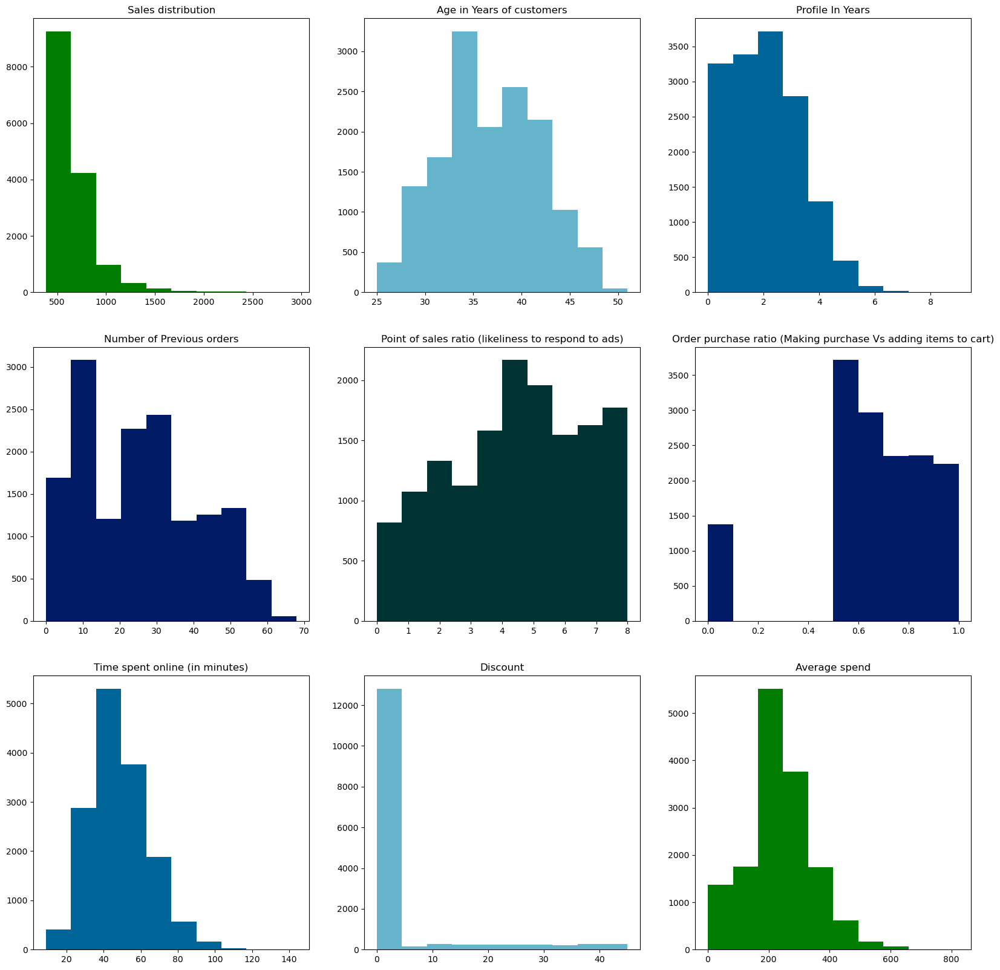

In [13]:
 #Histograms of the numerical variables to see their distributions
 fig, num_dist = plt.subplots(nrows = 3, ncols = 3,figsize=(20,20))

num_dist[0,0].hist(x= 'Sales', data = df_Num, color=plt.cm.ocean(1))
num_dist[0,0].set_title("Sales distribution")

num_dist[0, 1].hist(x= 'AgeInYears', data=df_Num, color=plt.cm.ocean(0.8))
num_dist[0,1].set_title("Age in Years of customers")

num_dist[0, 2].hist(x= 'ProfileInYears', data=df_Num, color=plt.cm.ocean(0.6))
num_dist[0,2].set_title("Profile In Years")

num_dist[1,0].hist(x= 'NumPrevOrders', data=df_Num, color=plt.cm.ocean(0.4))
num_dist[1,0].set_title("Number of Previous orders")

num_dist[1,1].hist(x= 'POSR', data=df_Num, color=plt.cm.ocean(0.2))
num_dist[1,1].set_title("Point of sales ratio (likeliness to respond to ads)")

num_dist[1,2].hist(x= 'OPR', data=df_Num, color=plt.cm.ocean(0.4))
num_dist[1,2].set_title("Order purchase ratio (Making purchase Vs adding items to cart)")

num_dist[2,0].hist(x= 'Online', data=df_Num, color=plt.cm.ocean(0.6))
num_dist[2,0].set_title("Time spent online (in minutes)")

num_dist[2,1].hist(x= 'Discount', data=df_Num, color=plt.cm.ocean(0.8))
num_dist[2,1].set_title("Discount")

num_dist[2,2].hist(x= 'AvgSpend', data=df_Num, color=plt.cm.ocean(1))
num_dist[2,2].set_title("Average spend")

plt.show()   

- Response variable Sales is skewed to the right, mean will not be a best measure of central tendency as there are outliers at play. 

#### Pearson Correlation

<Axes: >

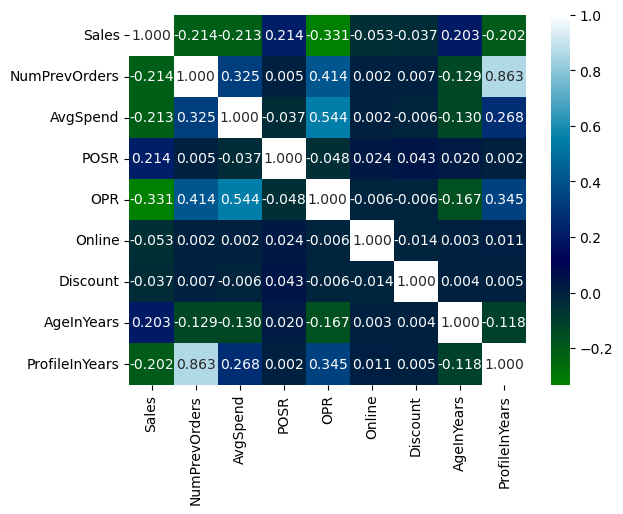

In [14]:
#General correlation matrix
my_corr_maties_num = df_Num.corr()
sns.heatmap(my_corr_maties_num, cmap='ocean', annot=True, fmt = ".3f")

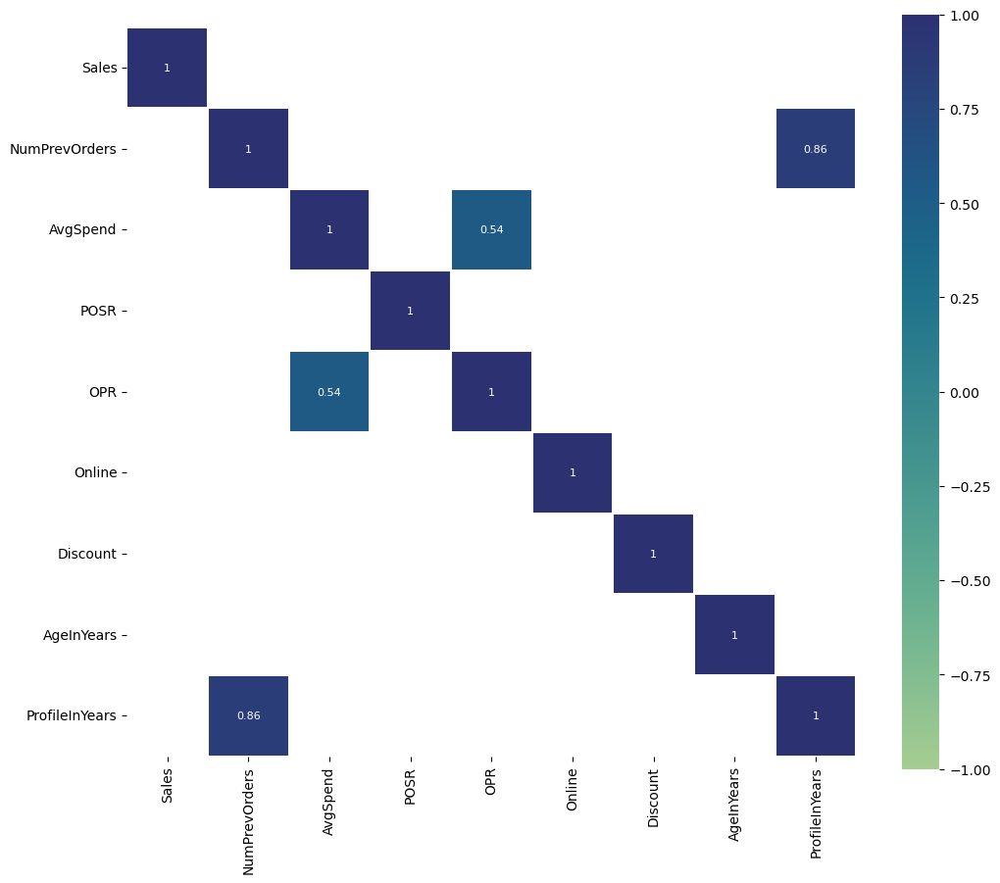

In [15]:
#Only show moderate to strong correlations for the numerical variables
my_corr_maties_num
plt.figure(figsize=(12, 10))
sns.heatmap(my_corr_maties_num[(my_corr_maties_num >= 0.5) | (my_corr_maties_num<= -0.5)], 
            cmap='crest', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);


- Response variable Sales does not have a strong linear relationship with other variables. 
- OPR and AvgSpend are mildly correlated.
- NumPrevOrders and ProfileInYears have a strong positive linear relationship, suggesting multicollinearity. Further investigation will be done using Variance Inflation Factor VIF.

#### Scatterplots of correlated numerical variables
- To find linear or nonlinear relationships between Sales and other variables
- To find potential key predictors

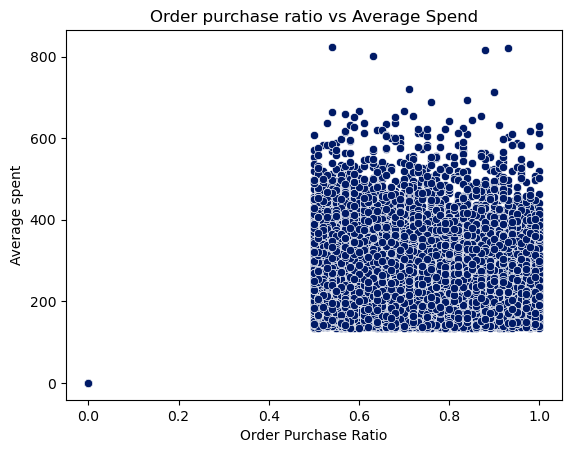

In [16]:
sns.scatterplot(data=df_Num , x = 'OPR', y = 'AvgSpend', color=plt.cm.ocean(0.4))
plt.title("Order purchase ratio vs Average Spend")
plt.ylabel("Average spent")
plt.xlabel("Order Purchase Ratio")
plt.show()

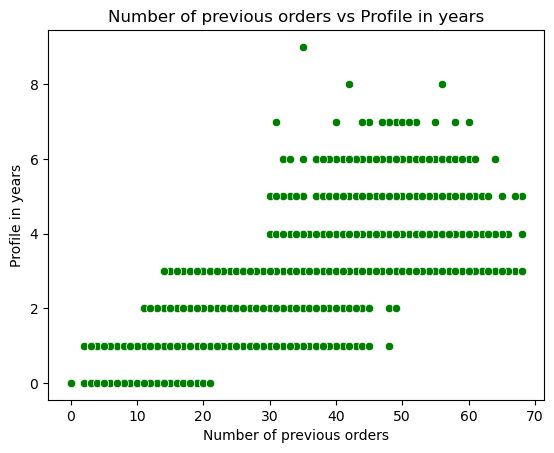

In [17]:
sns.scatterplot(data=df_Num  , x = 'NumPrevOrders', y = 'ProfileInYears', color=plt.cm.ocean(1))
plt.title("Number of previous orders vs Profile in years")
plt.ylabel("Profile in years")
plt.xlabel("Number of previous orders")
plt.show()

- The relationship between the number of previous orders a customer has and their profile in year is a positive horizontal stripe pattern, becayse the profile in years is a discrete variable. 

#### Scatterplots of all numeric variables

C:\Users\Lwandile\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lwandile\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lwandile\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lwandile\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN befo

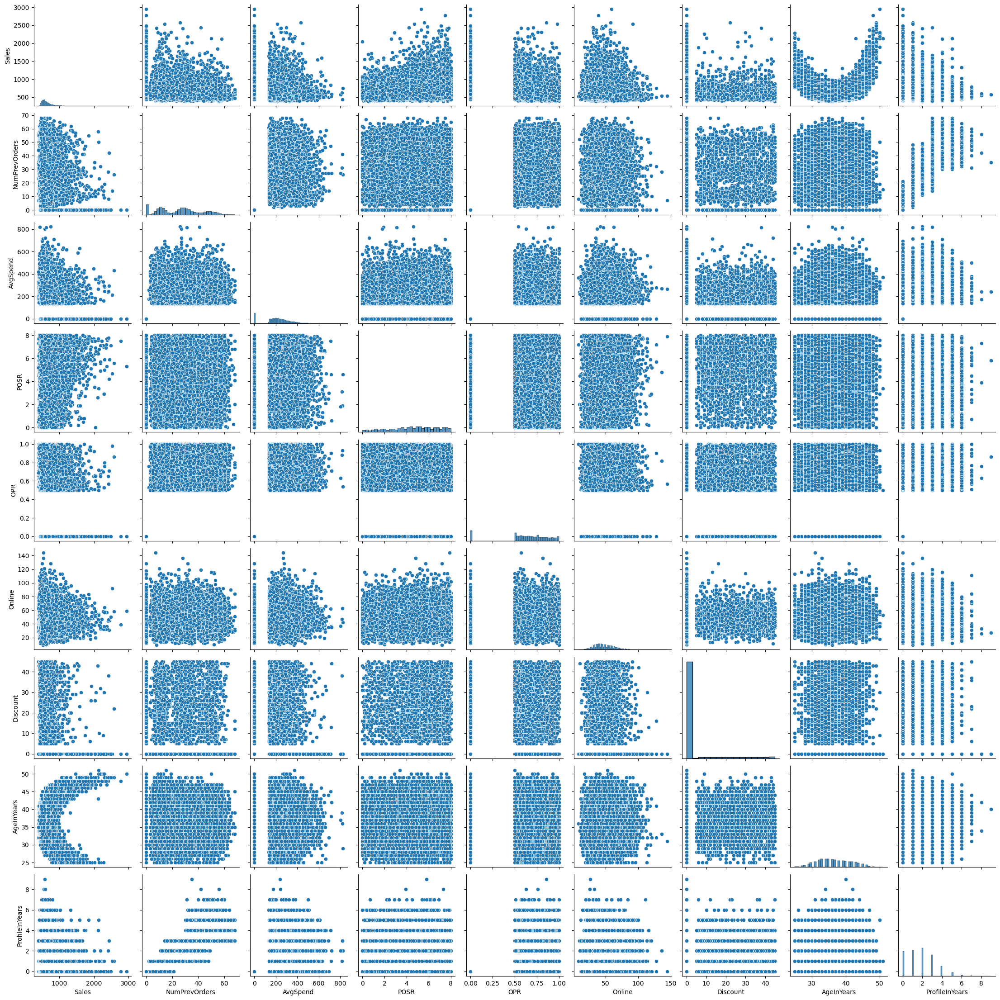

In [18]:
sns.pairplot(df_Num)

#### The graphs below look at the relationship between Sales and potential key predictors. 

Text(0.5, 1.0, ' Sales and OPR')

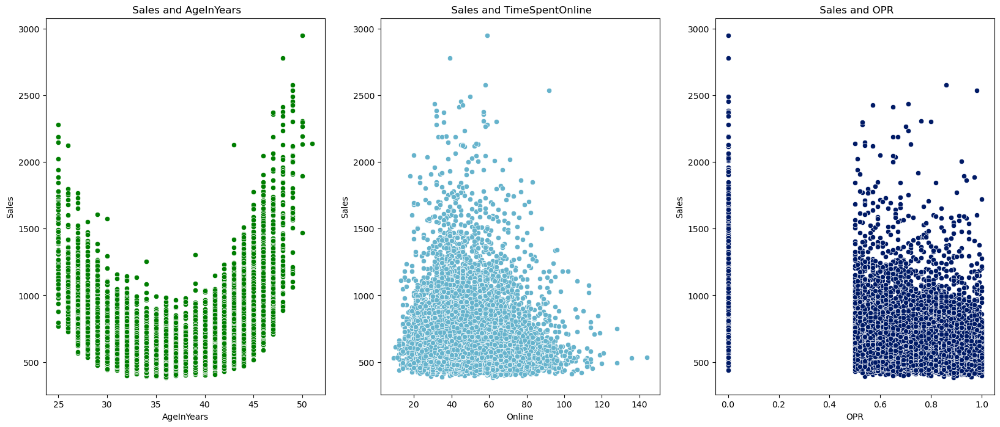

In [19]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (20,8))

sns.scatterplot(data = df_Num, y = 'Sales', x = 'AgeInYears', ax = axes[0], color=plt.cm.ocean(1))
axes[0].set_title(" Sales and AgeInYears")

sns.scatterplot(data = df_Num, y = 'Sales', x = 'Online', ax = axes[1], color=plt.cm.ocean(0.8))
axes[1].set_title(" Sales and TimeSpentOnline")

sns.scatterplot(data = df_Num, y = 'Sales', x = 'OPR', ax = axes[2], color=plt.cm.ocean(0.4))
axes[2].set_title(" Sales and OPR")

- Sales and AgeInYears have a quadratic (non-linear) relationship - Dependents (young and old) will typically have lesss to spend as they may not be finacnially independent. A transformation may have to be done on AgeInYears.
- Sales and the time spent Online is clustered to the left, however the data points are scattered all over, indicating a weak relationship.
- Sales and OPR is clustered to the right, however the cluster is scattered indicating a weak relationship. There is a vertical stipe pattern, representing the discreteness of not having an OPR score.

#### Quadratic Regression Model
Sales and AgeInYears have a quadratic relationship so a quadratic regression model will be fit

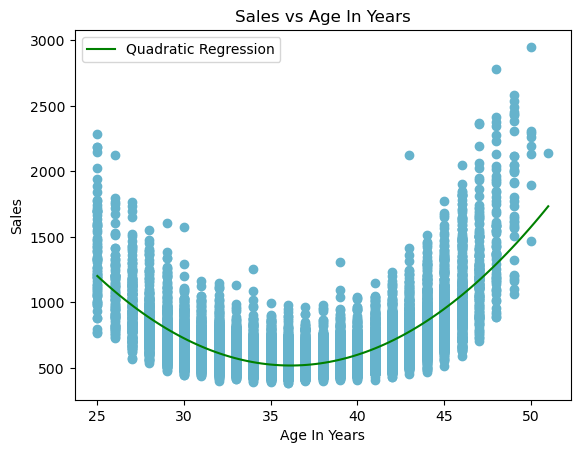

In [20]:
# Fit a quadratic regression model
coefficients = np.polyfit(df_Num['AgeInYears'], df_Num['Sales'], 2)  # Fit a quadratic (degree 2) polynomial

# Create a function to represent the quadratic regression line
quadratic_fit = np.poly1d(coefficients)

# Generate points for the regression line
x_regression = np.linspace(min(df_Num['AgeInYears']), max(df_Num['AgeInYears']), 100)
y_regression = quadratic_fit(x_regression)

# Plot the original data points
plt.scatter(df_Num["AgeInYears"], df_Num['Sales'], color=plt.cm.ocean(0.8) )

# Plot the quadratic regression line
plt.plot(x_regression, y_regression, label='Quadratic Regression', color='green')

# Add labels and legend
plt.xlabel('Age In Years')
plt.ylabel('Sales')
plt.title('Sales vs Age In Years')
plt.legend()

# Show the plot
plt.show()


### Categorical Analysis

#### Univariate Analysis

In [21]:
#Categorical variables summaries
df_Cat = df.select_dtypes(include=object)
df_Cat.describe()

,Month,Subscribed,ShippingOption,Shipping,Country,Platform,Payment,DayOfWeek,Ad_1,Ad_2,Ad_3,SocialMedia
count,15000,15000,15000,15000,15000,15000,15000,15000,15000,15000,15000,15000
unique,12,4,3,2,14,3,4,7,2,2,2,4
top,May,None,Express,Paid,South Africa,Computer,Credit Card,Saturday,No,Yes,Yes,None
freq,1332,10898,5875,13014,6552,11235,9833,3361,8960,7973,8781,8960


- Highest spending month is May
- Most orders are local
- Most transactions occur on a Saturday (weekend)

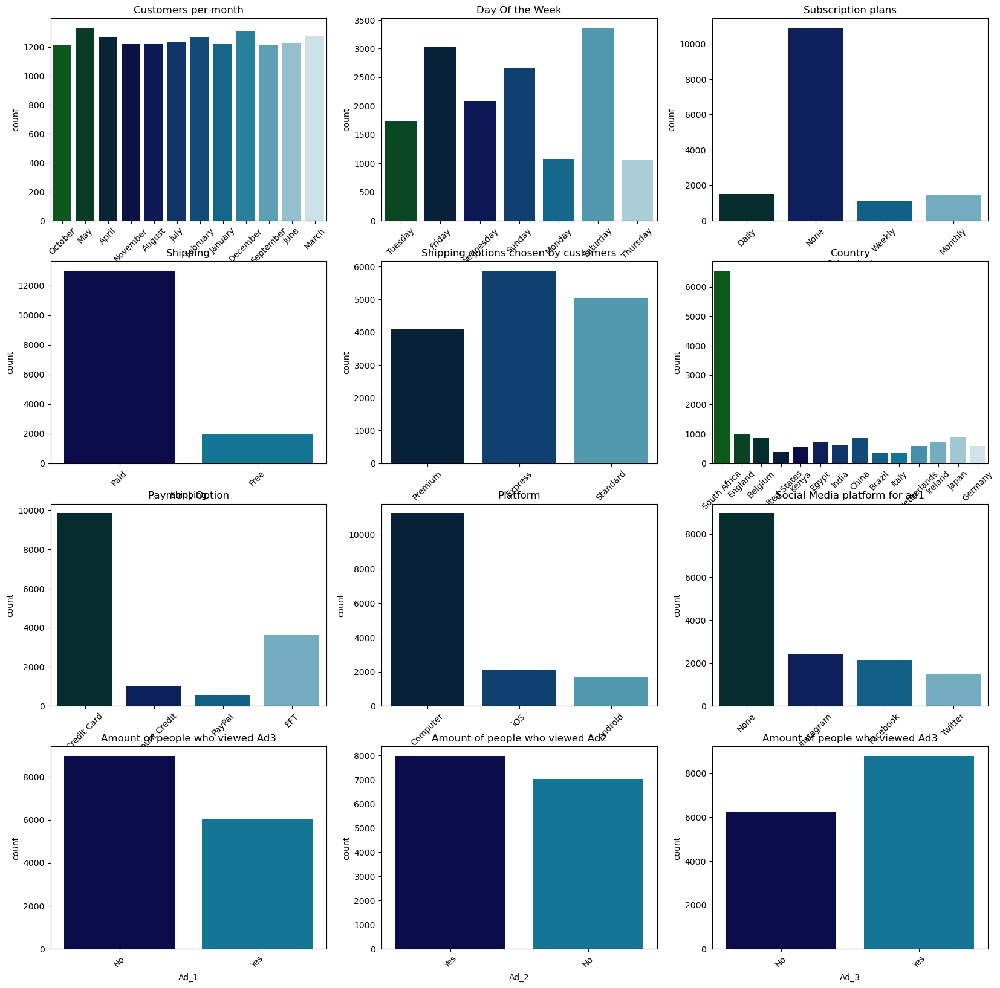

In [22]:
fig, cat_dist = plt.subplots(nrows = 4, ncols = 3,figsize=(20,20))
# Temporary view, I just want everything at one place so that I can veiw them properly 

sns.countplot(x= "Month",data =df_Cat , ax=cat_dist[0,0], palette = 'ocean').set(title="Customers per month")
cat_dist[0,0].set_xticklabels(cat_dist[0,0].get_xticklabels(),rotation=45)

sns.countplot(x= "Subscribed", data = df_Cat, ax=cat_dist[0,2], palette = 'ocean').set(title="Subscription plans")
cat_dist[0,2].set_xticklabels(cat_dist[0,2].get_xticklabels(),rotation=45)

sns.countplot(x= "ShippingOption",data = df_Cat, ax=cat_dist[1,1], palette = 'ocean').set(title="Shipping options chosen by customers")
cat_dist[1,1].set_xticklabels(cat_dist[1,1].get_xticklabels(),rotation=45)

sns.countplot(x= "Shipping",data = df_Cat, ax=cat_dist[1,0], palette = 'ocean').set(title="Shipping")
cat_dist[1,0].set_xticklabels(cat_dist[1,0].get_xticklabels(),rotation=45)

sns.countplot(x= "Country",data = df_Cat, ax=cat_dist[1,2], palette = 'ocean').set(title="Country")
cat_dist[1,2].set_xticklabels(cat_dist[1,2].get_xticklabels(),rotation=45)

sns.countplot(x= "DayOfWeek",data = df_Cat, ax=cat_dist[0,1], palette = 'ocean').set(title="Day Of the Week")
cat_dist[0,1].set_xticklabels(cat_dist[0,1].get_xticklabels(),rotation=45)

sns.countplot(x= "Platform",data = df_Cat, ax=cat_dist[2,1], palette = 'ocean').set(title="Platform")
cat_dist[2,1].set_xticklabels(cat_dist[2,1].get_xticklabels(),rotation=45)

sns.countplot(x= "Payment",data = df_Cat, ax=cat_dist[2,0], palette = 'ocean').set(title="Payment Option")
cat_dist[2,0].set_xticklabels(cat_dist[2,0].get_xticklabels(),rotation=45)

sns.countplot(x= "SocialMedia",data = df_Cat, ax=cat_dist[2,2], palette = 'ocean').set(title="Social Media platform for ad1")
cat_dist[2,2].set_xticklabels(cat_dist[2,2].get_xticklabels(),rotation=45)

sns.countplot(x= "Ad_1",data = df_Cat, ax=cat_dist[3,0], palette = 'ocean').set(title="Amount of people who viewed Ad3")
cat_dist[3,0].set_xticklabels(cat_dist[3,0].get_xticklabels(),rotation=45)

sns.countplot(x= "Ad_2",data = df_Cat, ax=cat_dist[3,1], palette = 'ocean').set(title="Amount of people who viewed Ad2")
cat_dist[3,1].set_xticklabels(cat_dist[3,1].get_xticklabels(),rotation=45)

sns.countplot(x= "Ad_3",data = df_Cat, ax=cat_dist[3,2], palette = 'ocean').set(title="Amount of people who viewed Ad3")
cat_dist[3,2].set_xticklabels(cat_dist[3,2].get_xticklabels(),rotation=45)
plt.show()

#### Average Sales by Day of the Week

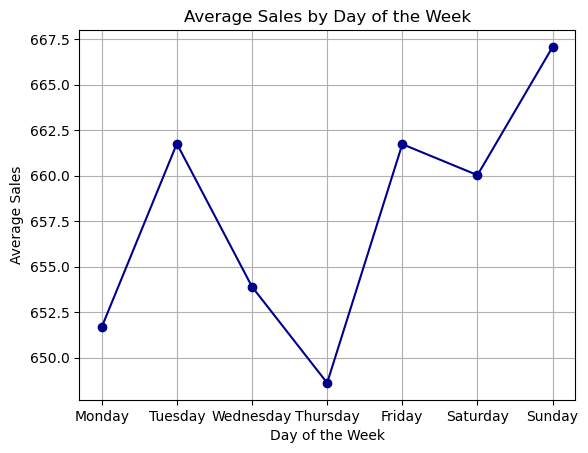

In [23]:
custom_order1 = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df['DayOfWeek'] = pd.Categorical(df['DayOfWeek'], categories = custom_order1, ordered=True)

day_trend = df.groupby('DayOfWeek', observed = 'False')['Sales'].mean()
plt.plot(day_trend.index, day_trend.values, marker='o', color = 'darkblue')
plt.xlabel('Day of the Week')
plt.ylabel('Average Sales')
plt.title('Average Sales by Day of the Week')
plt.grid(True)
plt.show()

- Although Sunday has the highest average sales of all the days of the week

#### Average Sales per Month

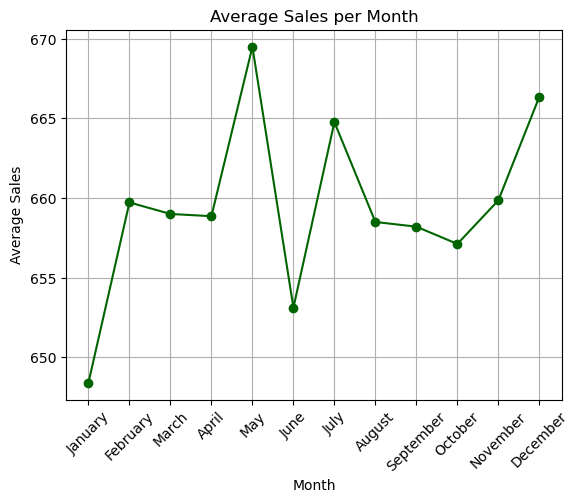

In [24]:
custom_order2 = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df['Month'] = pd.Categorical(df['Month'], categories = custom_order2, ordered=True)

month_trend = df.groupby('Month', observed = 'False')['Sales'].mean()
plt.plot(month_trend.index, month_trend.values, marker='o', color = 'darkgreen')
plt.xlabel('Month')
plt.ylabel('Average Sales')
plt.title('Average Sales per Month')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


- Highest average sales is in May, followed by December and June
- January and June perform poorly compared to other months

#### Ad use against Sales
- Investigating the effect of different ads on Sales
- How does mean sales change per ad use? Or without the use of ads?

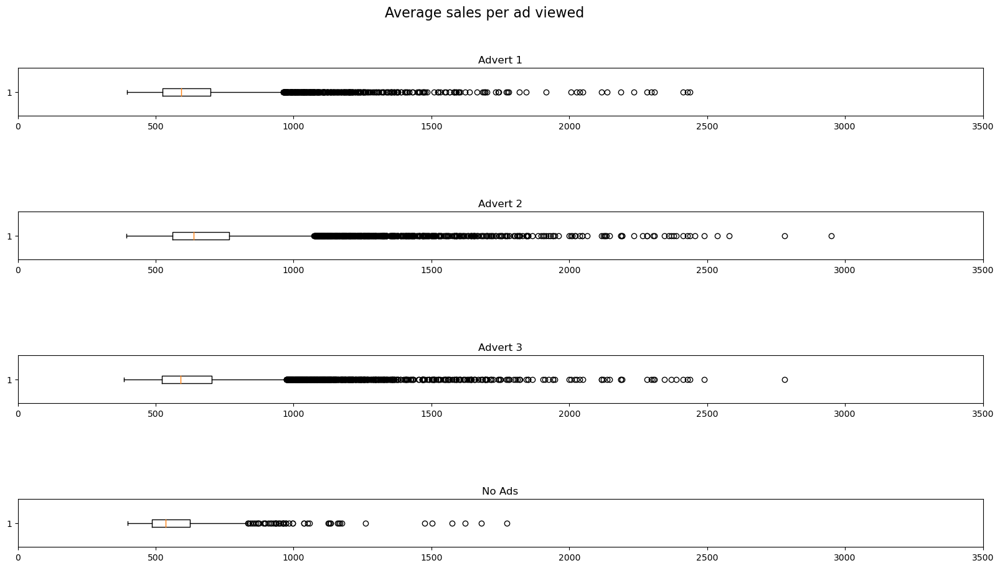

In [25]:
# How did the different adverts impact sales?
fig, ad_sales = plt.subplots(nrows = 4, ncols = 1,figsize=(20,10))
df_ad1 = df[-(df.Ad_1 == "No")]


ad_sales[0].boxplot(x='Sales', data = df[-(df.Ad_1 == "No")], vert=False)
ad_sales[1].boxplot(x='Sales', data = df[-(df.Ad_2 == "No")], vert=False)
ad_sales[2].boxplot(x='Sales', data = df[-(df.Ad_3 == "No")], vert=False)


ad_sales[0].set_title("Advert 1")
ad_sales[1].set_title("Advert 2")
ad_sales[2].set_title("Advert 3")
ad_sales[3].set_title("No Ads")
# Subsetting data where no person received adverts, how were they affected? 
df_no_ad = df[(df.Ad_1 == 'No') & (df.Ad_2 == 'No') & (df.Ad_3 == 'No')]
ad_sales[3].boxplot(x='Sales', data = df_no_ad, vert=False)

fig.suptitle("Average sales per ad viewed", fontsize = 16)
ad_sales[0].set_xlim(0,3500)
ad_sales[1].set_xlim(0,3500)
ad_sales[2].set_xlim(0,3500)
ad_sales[3].set_xlim(0,3500)
plt.subplots_adjust(hspace = 2)
#plt.tight_layout()
plt.show()


# Is there a better way of visualising or getting a numerical values of these adverts?
# place the numerical values of the graph, or use plotly express

In [26]:
# Having a numerical description of the above
data = {'Ad 1'  : df[df.Ad_1 == 'Yes']['Sales'],
        'Ad 2'  : df[df.Ad_2 == 'Yes']['Sales'],
        'Ad 3'  : df[df.Ad_3 == 'Yes']['Sales'],
        'No ads': df[(df.Ad_1 == 'No') & (df.Ad_2 == 'No') & (df.Ad_3 == 'No')]['Sales']}

ads_data = pd.DataFrame(data)
ads_data.describe()

,Ad 1,Ad 2,Ad 3,No ads
count,6040.000000,7973.000000,8781.000000,727.000000
mean,645.682321,710.240322,651.325789,586.134856
std,197.732205,248.767594,217.292764,166.913058
min,395.760000,394.280000,384.550000,398.140000
25%,523.847500,561.190000,521.960000,485.900000
50%,591.675000,638.600000,589.840000,536.300000
75%,698.962500,766.190000,702.750000,625.120000
max,2437.410000,2950.510000,2779.490000,1773.230000


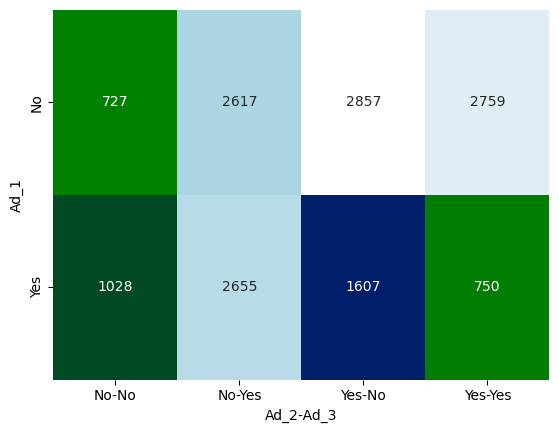

In [27]:
sns.heatmap(pd.crosstab(df_Cat.Ad_1, [df_Cat.Ad_2, df_Cat.Ad_3]),
         annot=True, cbar = False, cmap = 'ocean', 
            fmt="g")
plt.show()

- Average sales from box plots and summary statistics does not vary a lot.
- Boxplots reveal outliers - Sales is skewed.
- More customers view Ad_2 without Ad_1 and Ad_3.
- Fewer customers make purchases without having viewed any of the ads.


#### Ad performance in different countries

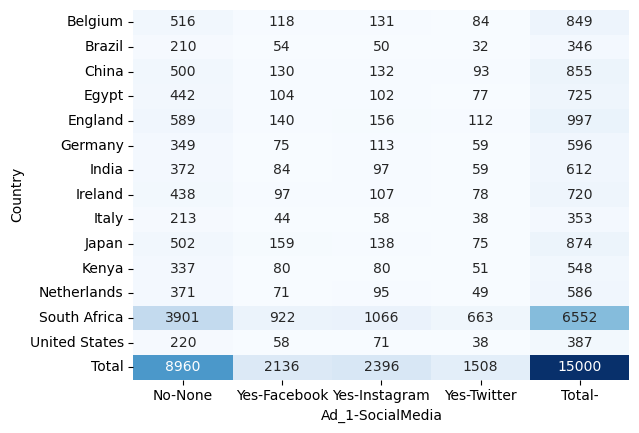

In [28]:
#Heatmap showing the relationship between payment and Ad_1 with respect to social media
sns.heatmap(pd.crosstab(df_Cat.Country, [df_Cat.Ad_1, df_Cat.SocialMedia],
           rownames = ["Country"], colnames = ["Ad_1","SocialMedia"], margins = True, margins_name = "Total"),
            cmap="Blues", annot=True, cbar = False, fmt="g")
plt.show()

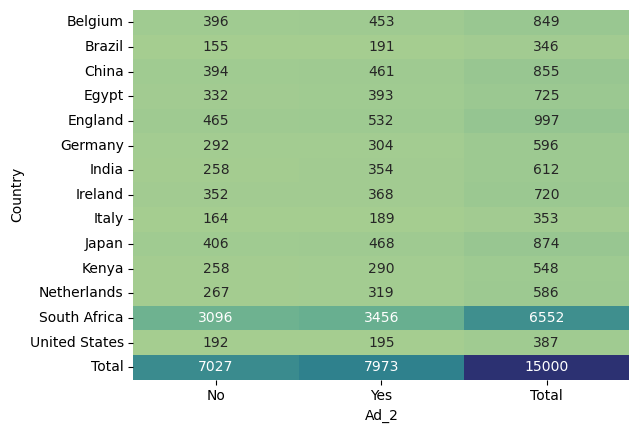

In [29]:
#Heatmap showing the relationship between country and Ad_2
sns.heatmap(pd.crosstab(df_Cat.Country, [df_Cat.Ad_2],
           rownames = ["Country"], colnames = ["Ad_2"], margins = True, margins_name = "Total"),
            cmap="crest", annot=True, cbar = False, fmt="g")
plt.show()

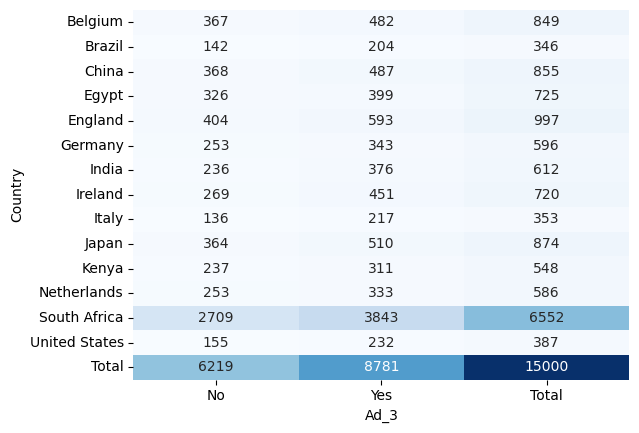

In [30]:
#Heatmap showing the relationship between country and Ad_3
sns.heatmap(pd.crosstab(df_Cat.Country, [df_Cat.Ad_3],
           rownames = ["Country"], colnames = ["Ad_3"], margins = True, margins_name = "Total"),
            cmap="Blues", annot=True, cbar = False, fmt="g")
plt.show()

- The country with the highest viewership of the ads is South Africa.
- Instagram is the social media platform with the highest viewership
- Ad_3 is the most effective out of the 3 (with highest number of customers buying after having come across it) 

#### Feature Transformation 2: Group Age
Grouped the ages to be able to better 'understand' how it would be able to relate to other variables

In [31]:
bins = [0,30,35,40,45,100]
labels = ["<30", "30-34","35-39","40-44",">44"]
palette = ["#69d"]

df_temp['age_group'] = pd.cut(df_Num['AgeInYears'], bins=bins, labels=labels, right=False)


# Using facet_col arguments to create Sub plots
fig = px.scatter(df_temp, x="AvgSpend", y="Sales", facet_col="age_group", color="age_group", 
                 color_discrete_sequence = ['aliceblue', 'azure', 'coral', 'forestgreen', 'darkolivegreen'], template = "plotly_white")
# Hide grid lines
fig.update_xaxes(showgrid=False, title="")
fig.update_yaxes(showgrid=False)
fig.update_layout(legend_title_text="Background", xaxis3=dict(title="Average Spent"))
fig.show()

- Customers 40>=n spend  more money than others

In [32]:
fig = px.scatter(df_temp, x="POSR", y="Sales" ,color="age_group", facet_col='age_group',
                 color_discrete_sequence = px.colors.qualitative.Bold, template = "plotly_white")

fig.update_xaxes(showgrid=False, title="POSR")
fig.update_yaxes(showgrid=False)
fig.update_layout(legend_title_text="Background", xaxis2=dict(title="POSR"))
fig.show()

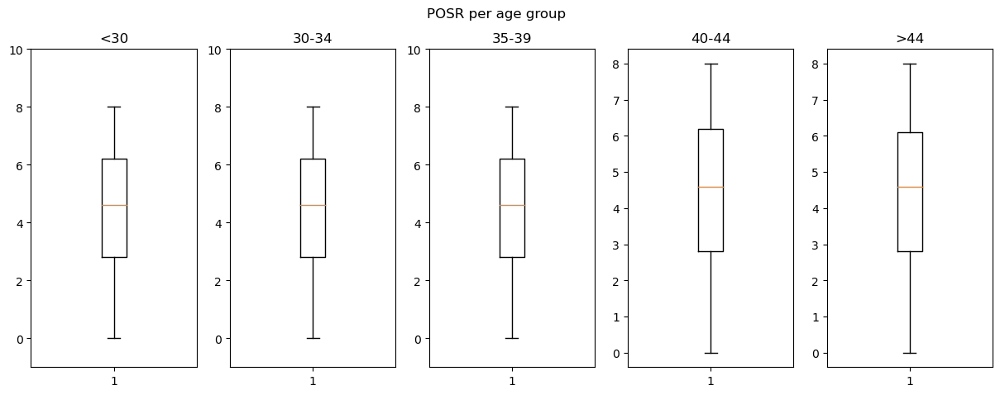

In [33]:
fig, ads_POSR = plt.subplots(nrows = 1, ncols = 5,figsize=(15,5))


ads_POSR[0].boxplot(x='POSR', data = df_temp[-(df_temp.age_group== "<30")], vert=True)
ads_POSR[1].boxplot(x='POSR', data = df_temp[-(df_temp.age_group == "30-34")], vert=True)
ads_POSR[2].boxplot(x='POSR', data = df_temp[-(df_temp.age_group == "35-39")], vert=True)
ads_POSR[3].boxplot(x='POSR', data = df_temp[-(df_temp.age_group == "40-44")], vert=True)
ads_POSR[4].boxplot(x='POSR', data = df_temp[-(df_temp.age_group == ">44")], vert=True)


ads_POSR[0].set_title("<30")
ads_POSR[1].set_title("30-34")
ads_POSR[2].set_title("35-39")
ads_POSR[3].set_title("40-44")
ads_POSR[4].set_title(">44")

fig.suptitle("POSR per age group")
ads_POSR[0].set_ylim(-1,10)
ads_POSR[1].set_ylim(-1,10)
ads_POSR[2].set_ylim(-1,10)
plt.show()




In [34]:
# Average spend and sales with respect to order purchase rate
fig = px.scatter(df_temp, x="AvgSpend", y="Sales", color="OPR", 
                 color_discrete_sequence = px.colors.qualitative, template = "plotly_white")
# Hide grid lines
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.update_layout(legend_title_text="Background", xaxis2=dict(title="NumPrevOrders"))
fig.show()

Customers of the different age groups have the same Point-of-Sales Ratio.

#### Shipping against Sales

Most purchases are on paid shipping ( makes sense since Maties Marketplace does international orders)

Shipping option premium has the highest mean sales out of all the shipping options

In [35]:
df.groupby(['ShippingOption','Shipping'])['Sales'].describe()

count        mean         std     min       25%  \
ShippingOption Shipping                                                     
Express        Free       574.0  680.976254  238.874708  415.19  537.5975   
               Paid      5301.0  653.908589  214.246147  384.55  524.2500   
Premium        Free       110.0  666.772909  205.408206  429.65  515.5500   
               Paid      3971.0  672.640818  229.601084  387.66  532.5050   
Standard       Free      1302.0  648.019017  226.052913  403.82  518.9975   
               Paid      3742.0  654.241235  212.719412  395.76  526.0325   

                             50%       75%      max  
ShippingOption Shipping                              
Express        Free      622.815  740.9950  2437.41  
               Paid      592.640  708.0600  2579.60  
Premium        Free      591.440  756.2475  1654.57  
               Paid      609.400  725.3800  2950.51  
Standard       Free      582.175  696.4500  2779.49  
               Paid      595.175  706.6175  2428.87

Most purchases uses express as their shipping option and also expess has the highest mean sales when its free shipping out of all the other shipping options.

#### Email listings

In [36]:
df_temp.groupby(['Subscribed'])['Sales'].describe()

,count,mean,std,min,25%,50%,75%,max
Subscribed,,,,,,,,
Daily,1512.0,675.821693,210.053939,384.55,550.1000,620.285,726.3975,2437.41
Monthly,1460.0,640.707144,195.083948,404.54,524.5975,589.775,698.3625,2579.60
None,10898.0,665.556256,229.056916,387.66,525.8500,599.785,721.5875,2950.51
Weekly,1130.0,604.456690,158.444770,407.41,511.3150,563.870,645.8475,2281.96


There is not much of a difference, but those who were subscribed daily, spent more on average. Also those who subsrcibed monthly, spent less than those not subscribed.

#### Feature Transformation 3: Group Discount
Grouped the discount to be able to better 'understand' how it would be able to relate to other variables

In [37]:
#Grouping discounts
bins = [0,10,20,30,40,50]
labels = ["<1","1-10", "11-20","21-30", ">30"]

df_temp['Dis_group'] = pd.cut(df_temp['Discount'], bins=bins, labels=labels, right=False)

In [38]:
df_temp1 = df_temp.select_dtypes(exclude=object)
df_temp1.groupby("Dis_group")["Sales"].describe()

,count,mean,std,min,25%,50%,75%,max
Dis_group,,,,,,,,
<1,13038.0,663.049302,221.977318,384.55,528.4025,601.025,717.390,2950.51
1-10,569.0,631.279385,176.399608,398.14,520.2400,585.810,682.500,2145.24
11-20,532.0,644.405508,213.559343,419.50,516.8450,577.400,715.975,2579.60
21-30,547.0,635.635302,229.192558,412.21,508.2250,573.390,681.560,2428.87
>30,314.0,633.732357,202.212203,387.66,517.5350,575.660,689.575,2115.77


## Linear Regression Analysis


A linear regression model is constructed to interpret which variables are related to sales, and the model must be used to give insights to how Mable Marketplace can increase sales.

#### Dummy Variables

The function below will be used to change and encode categorical variables into binary dummy variables. The selected baseline will be encoded with a 1 and the other values a 0. The baseline column will be dropped.

In [39]:
def make_dummies(data, colname, baseline):
    col = data[colname]
    
    dummies = pd.get_dummies(col, prefix=colname, drop_first=False).astype(int)

    bline_col = f"{colname}_{baseline}"

    if bline_col in dummies.columns:
        dummies = dummies.drop(columns=[bline_col])
    
    dfnew = data.copy() 
    dfnew.drop(columns=colname, inplace = True)
    dfnew = pd.concat([dfnew, dummies], axis=1)
    return dfnew

In [40]:
# Changing the dummy variables into categorical variables
new_data = make_dummies(df, 'Month', 'January') #instead of using df_temp in the parameter, use just df)
new_data = make_dummies(new_data, 'ShippingOption', 'Standard')
new_data = make_dummies(new_data, 'Subscribed', 'Daily')
new_data = make_dummies(new_data, 'Shipping', 'Free')
new_data = make_dummies(new_data, 'Country', 'South Africa')
new_data = make_dummies(new_data, 'Platform', 'Computer')
new_data = make_dummies(new_data, 'DayOfWeek', 'Monday')
new_data = make_dummies(new_data, 'Ad_1', 'No')
new_data = make_dummies(new_data, 'Ad_2', 'No')
new_data = make_dummies(new_data, 'Ad_3', 'No')
new_data = make_dummies(new_data, 'Payment', 'Account Credit')
new_data = make_dummies(new_data, 'SocialMedia', 'None')

#### Training and Testing splits 
We split our data into a 70% training data set and a 30% testing data set.

In [41]:
from sklearn.model_selection import train_test_split
X = new_data.copy()
X = X.drop(columns = 'Sales')
y = new_data['Sales']
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size = 0.7, test_size = 0.3, random_state= 20)

#### Functions: SequentialFeatureSelection, Cross Validation, Graphs

The `get_models` builds linear regression models and performs cross validation for our foward feature selection method. Then, after getting all the models from the forward feature selection, it stores statistical metrics of all the models built.

The `find_best_model` looks through all the models that were built during the forward selection process and selects the model with the highest adjusted R square value. It removes predictors that have high p-values from the selected model, and returns that as our best model. 

The `metrics_graph` accepts the k models built during the `get_models` process, and visually represents the AIC, BIC and adjusted R squared. 

The `plots` function plots the Residual vs Predicted Values and QQplot Graphs for the specified model.

In [42]:
sfs = SequentialFeatureSelector(LinearRegression(),k_features = 53, forward = True, scoring = 'neg_mean_squared_error', cv = 5)

def get_models(X_train, y_train):
    foward_model = sfs.fit(X_train, y_train)
    rslt_dict = foward_model.get_metric_dict()

    # Getting a dataframe which will contain all the metrics in a table. 
    col_names = ["new_feature", 'AIC', 'BIC', 'R', 'adj_R','valid_mse','all features']
    prev_predictors = ['']
    models_info = pd.DataFrame(columns = col_names)
    i = -1
    for _, item in rslt_dict.items():
        i = i+ 1
            
        predictors = item['feature_names']
        
        #fitting the model with a training data set 
        X_fit = X_train.copy()
        X_fit = X_fit[list(predictors)]
        X_fit['Intercept'] = 1
        mod = sm.OLS(y_train, X_fit).fit()
        AIC = round(mod.aic, 4)
        BIC = round(mod.bic, 4)
        r = round(mod.rsquared, 4)
        adj_r = round(mod.rsquared_adj, 4)
        new_feature = [x for x in predictors if x not in prev_predictors][0]
        
        new_entry = pd.DataFrame({'new_feature': [new_feature],
                             'AIC': [AIC],
                             'BIC': [BIC],
                                  'R': [r],
                             'adj_R': [adj_r],
                             #'valid_mse': [ave_mse],
                             'all features': [predictors]})
        
        models_info = pd.concat([models_info, new_entry], ignore_index=True)
        prev_predictors = predictors
    return models_info

In [43]:
def find_best_model(info, x_train, y_train):
    #Finding the model with the highest Adjusted R squared
    best_adj = -sys.maxsize
    model = 0
    best_model = 0

    for _, adj in info['adj_R'].items():
        if adj > best_adj:
            best_adj = adj
            best_model = model
        model = model + 1
    
    #Filtering out the features with low p-values. This step is repeated twice, because when features are removed from a model, p-value can change.
    pred = info['all features'][best_model]
    X_fit = x_train.copy()
    X_fit = X_fit[list(pred)]
    X_fit['Intercept'] = 1
    test_model = sm.OLS(y_train, X_fit).fit()
    
    p_vals = test_model.pvalues
    high_p_value = [pred for pred, p_value in p_vals.items() if p_value >= 0.04999]
    X_fit = X_fit.drop(columns = high_p_value)

    model_best = sm.OLS(y_train, X_fit).fit()

    p_vals = model_best.pvalues
    high_p_value = [pred for pred, p_value in p_vals.items() if p_value >= 0.04999]
    X_fit = X_fit.drop(columns = high_p_value)

    #Return the final model
    model_best = sm.OLS(y_train, X_fit).fit()
    return model_best

In [44]:
def metrics_graph(models_info):
    selected = models_info[:]

    plt.figure(figsize = (16,10))
    plt.scatter(np.arange(len(selected)), selected['AIC'], color = 'red')
    plt.plot(np.arange(len(selected)), selected['AIC'], color = 'red')

    plt.scatter(np.arange(len(selected)), selected['BIC'], color = 'blue')
    plt.plot(np.arange(len(selected)), selected['BIC'], color = 'blue')

    plt.legend()
    plt.title('The AIC and the BIC of the models')
    plt.xticks(ticks = np.arange(len(selected)), labels = selected['new_feature'], rotation = 90)
    plt.show()

    plt.figure(figsize = (16,10))

    plt.scatter(np.arange(len(selected)), selected['adj_R'], color = 'blue')
    plt.plot(np.arange(len(selected)), selected['adj_R'], color = 'blue')
    plt.xticks(ticks = np.arange(len(selected)), labels = selected['new_feature'], rotation = 90)
    plt.title('The adjusted R squared as predictors are added')
    plt.show()


In [45]:
from statsmodels.api import qqplot

def plots(actual,predicted, train_predictions,residuals):
    fig , axes = plt.subplots(1, 2, figsize = (15,4))
    sns.residplot(x = train_predictions, y = residuals, lowess = True, line_kws = {'color': 'red'}, ax = axes[0])
    axes[0].set_title('Residuals vs Predicted Values')
    axes[0].set_xlabel('Predicted Values')
    axes[0].set_ylabel('Residuals')
    
    
    qqplot(data = residuals, fit = True, line = '45', ax = axes[1])
    plt.show()

In [46]:
# Data frame to store model performance metrics
col_names = ["mod_desc", "AIC", "BIC", "adj-R", "test MSE", "RMSE"]
all_models_performance = pd.DataFrame(columns = col_names)

### Regression Model Development


#### Original Baseline Model

Building linear regression models via sequential feature selection:

In [47]:
origin_info = get_models(X_train, y_train)

C:\Users\Lwandile\AppData\Local\Temp\ipykernel_2436\3854041500.py:36: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Visualising the AIC, BIC and Adjusted R squared metrics of the 53 models:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


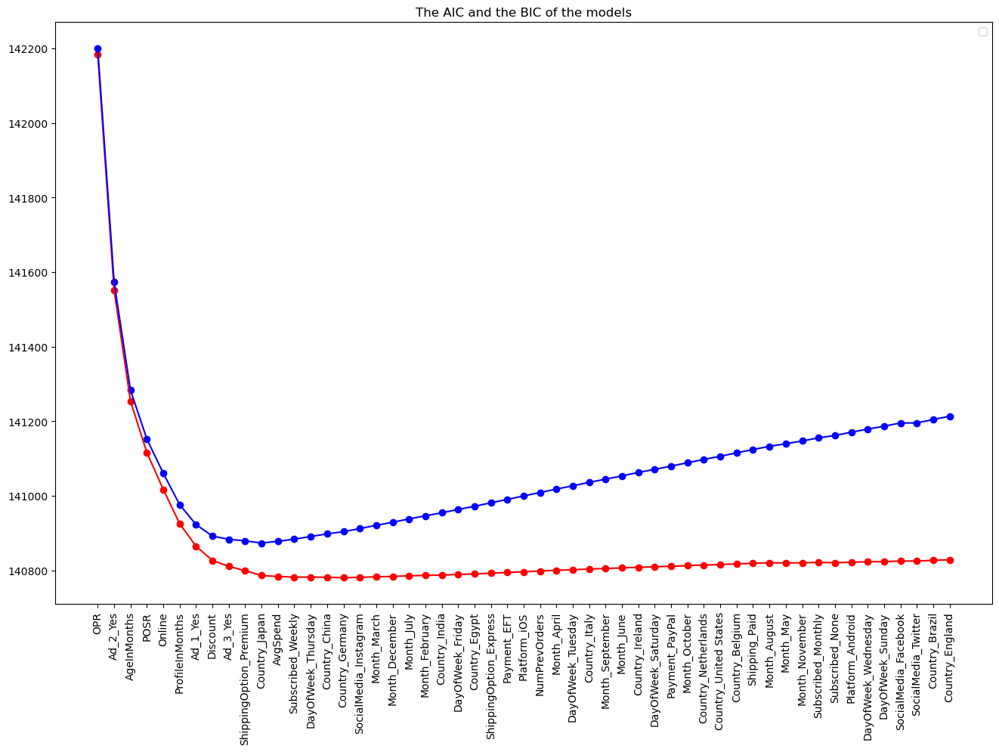

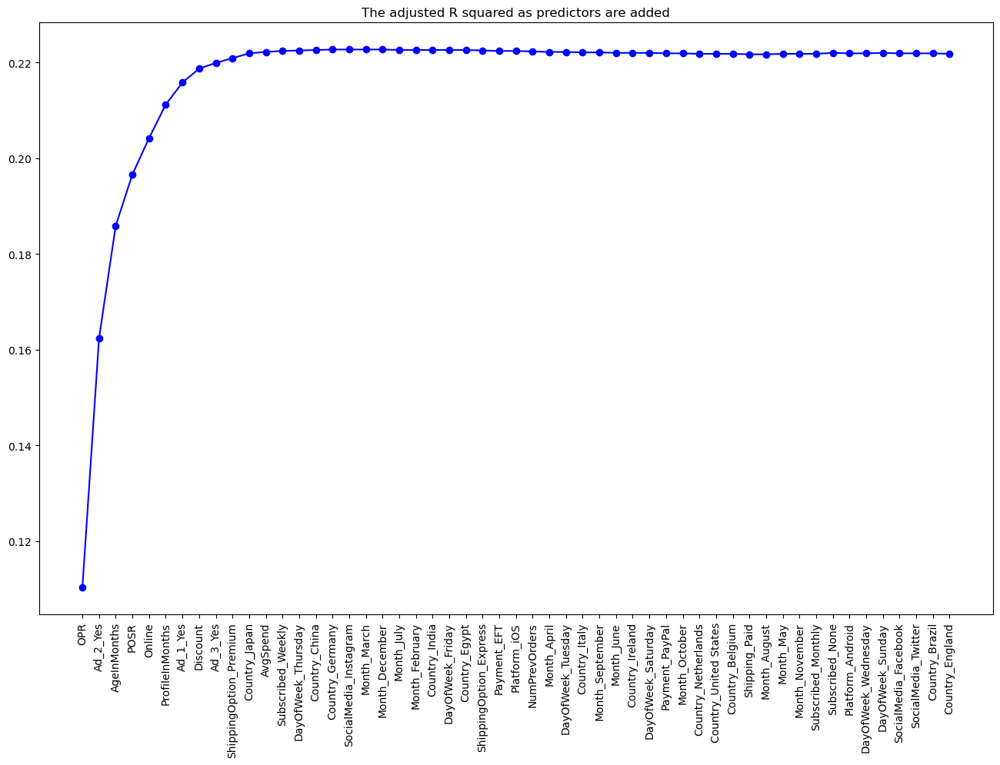

In [48]:
graph = metrics_graph(origin_info)

- AIC and BIC curve is at its minimum (optimal model) between Ad 3 and Country_Japan is added.
-  Adjusted R squared graph indicates that adding variables improved the model.
- Peak of the graph (optimal model) is around when Ad 3 was added, and then graph plateaus.
- This gives a rough idea of which features drive Sales

The 53 models built sorted from the highest adjusted R squared to the lowest:

In [49]:
sorted_info = origin_info.sort_values(by= ['AIC', 'BIC', 'adj_R'], ascending=[True, True, False])
sorted_info

,new_feature,AIC,BIC,R,adj_R,valid_mse,all features
15,Country_Germany,140780.3994,140903.8046,0.2239,0.2227,NaN,"(AgeInMonths, ProfileInMonths, AvgSpend, POSR,..."
16,SocialMedia_Instagram,140781.5556,140912.2199,0.2240,0.2227,NaN,"(AgeInMonths, ProfileInMonths, AvgSpend, POSR,..."
14,Country_China,140781.6728,140897.8189,0.2237,0.2226,NaN,"(AgeInMonths, ProfileInMonths, AvgSpend, POSR,..."
12,Subscribed_Weekly,140782.0778,140883.7056,0.2233,0.2224,NaN,"(AgeInMonths, ProfileInMonths, AvgSpend, POSR,..."
13,DayOfWeek_Thursday,140782.0949,140890.9819,0.2235,0.2225,NaN,"(AgeInMonths, ProfileInMonths, AvgSpend, POSR,..."
17,Month_March,140782.8639,140920.7873,0.2240,0.2227,NaN,"(AgeInMonths, ProfileInMonths, AvgSpend, POSR,..."
11,AvgSpend,140783.7448,140878.1135,0.2231,0.2222,NaN,"(AgeInMonths, ProfileInMonths, AvgSpend, POSR,..."
18,Month_December,140783.9119,140929.0945,0.2241,0.2227,NaN,"(AgeInMonths, ProfileInMonths, AvgSpend, POSR,..."
19,Month_July,140785.5625,140938.0043,0.2241,0.2226,NaN,"(AgeInMonths, ProfileInMonths, AvgSpend, POSR,..."
10,Country_Japan,140786.2870,140873.3966,0.2227,0.2219,NaN,"(AgeInMonths, ProfileInMonths, POSR, OPR, Onli..."


Selecting the optimal model from the 53 models as the Original Baseline Model:

In [50]:
origin_model = find_best_model(origin_info, X_train, y_train)
origin_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Sales   R-squared:                       0.223
Model:                            OLS   Adj. R-squared:                  0.222
Method:                 Least Squares   F-statistic:                     250.9
Date:                Fri, 14 Aug 2026   Prob (F-statistic):               0.00
Time:                        16:27:09   Log-Likelihood:                -70379.
No. Observations:               10500   AIC:                         1.408e+05
Df Residuals:                   10487   BIC:                         1.409e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
AgeInMonths                0.5507      0.032     17.052      0.000       0.487       0.614
ProfileInMonths           -1.1938      0.123     -9.731      0.000      -1.434      -0.953
AvgSpend                  -0.0435      0.020     -2.130      0.033      -0.083      -0.003
POSR                      11.8364      1.010     11.722      0.000       9.857      13.816
OPR                     -227.3626      9.689    -23.465      0.000    -246.356    -208.369
Online                    -1.2222      0.123     -9.902      0.000      -1.464      -0.980
Discount                  -1.1258      0.195     -5.775      0.000      -1.508      -0.744
ShippingOption_Premium    16.6844      4.380      3.809      0.000       8.098      25.271
Country_Japan             32.1046      8.315      3.861      0.000      15.806      48.403
Ad_1_Yes                  35.3307      4.145      8.523      0.000      27.205      43.456
Ad_2_Yes                  97.0089      4.682     20.722      0.000      87.832     106.186
Ad_3_Yes                  17.8044      4.163      4.276      0.000       9.643      25.965
Intercept                535.6682     18.281     29.301      0.000     499.833     571.503
==============================================================================
Omnibus:                     6534.966   Durbin-Watson:                   1.995
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            90863.188
Skew:                           2.783   Prob(JB):                         0.00
Kurtosis:                      16.293   Cond. No.                     4.92e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.92e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

- Model number 12 was the final selected model with 12 features that drive Sales


The ML approach in this notebook is sequential. Multiple models will be built sequentially using training data and evaluated at the end with test data to prevent test leakage. 

#### Fixing heteroscedesticity

In [51]:
y_log = y_train.copy()
y_log = np.log(y_log)
log_info = get_models(X_train, y_log)
log_model = find_best_model(log_info, X_train, y_log)

predictors = log_model.params.index.tolist()
X_log = X_train.copy()
X_log['Intercept'] = 1
X_log = X_log[predictors]
log_model = sm.OLS(y_log, X_log).fit()
log_model.summary()

C:\Users\Lwandile\AppData\Local\Temp\ipykernel_2436\3854041500.py:36: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Sales   R-squared:                       0.258
Model:                            OLS   Adj. R-squared:                  0.257
Method:                 Least Squares   F-statistic:                     279.9
Date:                Fri, 14 Aug 2026   Prob (F-statistic):               0.00
Time:                        16:28:35   Log-Likelihood:                 484.94
No. Observations:               10500   AIC:                            -941.9
Df Residuals:                   10486   BIC:                            -840.3
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
AgeInMonths                0.0006   3.79e-05     15.367      0.000       0.001       0.001
ProfileInMonths           -0.0016      0.000    -10.733      0.000      -0.002      -0.001
POSR                       0.0158      0.001     13.379      0.000       0.014       0.018
OPR                       -0.3072      0.010    -30.534      0.000      -0.327      -0.287
Online                    -0.0018      0.000    -12.652      0.000      -0.002      -0.002
Discount                  -0.0017      0.000     -7.406      0.000      -0.002      -0.001
ShippingOption_Premium     0.0239      0.005      4.639      0.000       0.014       0.034
Subscribed_None           -0.0182      0.005     -3.380      0.001      -0.029      -0.008
Country_Germany            0.0239      0.012      2.072      0.038       0.001       0.047
Country_Japan              0.0358      0.010      3.663      0.000       0.017       0.055
Ad_1_Yes                   0.0509      0.005     10.480      0.000       0.041       0.060
Ad_2_Yes                   0.1349      0.005     24.586      0.000       0.124       0.146
Ad_3_Yes                   0.0207      0.005      4.234      0.000       0.011       0.030
Intercept                  6.3624      0.022    286.399      0.000       6.319       6.406
==============================================================================
Omnibus:                     2576.889   Durbin-Watson:                   1.990
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6560.055
Skew:                           1.336   Prob(JB):                         0.00
Kurtosis:                       5.802   Cond. No.                     4.54e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.54e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### Polynomial Feature 


Age and the target variable Sales have a quadratic relatinship. A squared term is introduced to build a polynomial linear regression model:

In [52]:
#transforming age
X_train["AgeInMonths"] = X_train["AgeInMonths"] - X_train["AgeInMonths"].mean()
X_train['AgeInMonths_squared'] = X_train['AgeInMonths']**2
#X_train_dropped = X_train.drop(columns = 'AgeInMonths')

In [53]:
square_info = get_models(X_train, y_train)
square_model = find_best_model(square_info, X_train, y_train)
square_model.summary()

C:\Users\Lwandile\AppData\Local\Temp\ipykernel_2436\3854041500.py:36: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Sales   R-squared:                       0.703
Model:                            OLS   Adj. R-squared:                  0.703
Method:                 Least Squares   F-statistic:                     1551.
Date:                Fri, 14 Aug 2026   Prob (F-statistic):               0.00
Time:                        16:30:02   Log-Likelihood:                -65329.
No. Observations:               10500   AIC:                         1.307e+05
Df Residuals:                   10483   BIC:                         1.308e+05
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
AgeInMonths                0.3464      0.020     17.313      0.000       0.307       0.386
AvgSpend                  -0.0250      0.013     -1.991      0.047      -0.050      -0.000
POSR                      11.7254      0.624     18.779      0.000      10.501      12.949
OPR                     -181.2571      5.805    -31.223      0.000    -192.636    -169.878
Online                    -1.2652      0.076    -16.579      0.000      -1.415      -1.116
Discount                  -0.8591      0.121     -7.125      0.000      -1.095      -0.623
ShippingOption_Premium    15.9487      2.708      5.889      0.000      10.640      21.258
Subscribed_None          -12.0397      2.712     -4.440      0.000     -17.355      -6.724
Country_Japan             16.5270      5.144      3.213      0.001       6.445      26.609
DayOfWeek_Wednesday       -7.6792      3.559     -2.157      0.031     -14.656      -0.702
DayOfWeek_Thursday       -12.4797      4.741     -2.632      0.008     -21.774      -3.186
DayOfWeek_Saturday         6.1477      2.973      2.068      0.039       0.320      11.976
Ad_1_Yes                  32.0340      2.557     12.527      0.000      27.021      37.047
Ad_2_Yes                  96.5603      2.895     33.357      0.000      90.886     102.235
Ad_3_Yes                  15.4772      2.574      6.012      0.000      10.431      20.523
AgeInMonths_squared        0.0377      0.000    131.082      0.000       0.037       0.038
Intercept                590.2846      6.992     84.428      0.000     576.580     603.989
==============================================================================
Omnibus:                     4339.125   Durbin-Watson:                   2.016
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            49783.858
Skew:                           1.663   Prob(JB):                         0.00
Kurtosis:                      13.136   Cond. No.                     3.65e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.65e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### Interactions

Point of Sales Ratio can be influnced by whether a client views a certain Ad or not. Since the original baseline model has Ad 2 as a driving feature, an interaction term between POSR and Ad 2 is added to evaluate the impact of this interaction on the target variable Sales.

In [54]:
predictors = log_model.params.index.tolist()
#predictors
X_inter = X_train.copy()
X_inter['Intercept'] = 1
X_inter = X_inter[predictors]

X_inter['POSR*Ad_2'] = X_inter['POSR'] * X_inter['Ad_2_Yes']

inter_model = sm.OLS(y_log, X_inter).fit()
inter_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Sales   R-squared:                       0.273
Model:                            OLS   Adj. R-squared:                  0.272
Method:                 Least Squares   F-statistic:                     281.7
Date:                Fri, 14 Aug 2026   Prob (F-statistic):               0.00
Time:                        16:30:02   Log-Likelihood:                 596.83
No. Observations:               10500   AIC:                            -1164.
Df Residuals:                   10485   BIC:                            -1055.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
AgeInMonths                0.0006   3.75e-05     15.470      0.000       0.001       0.001
ProfileInMonths           -0.0016      0.000    -11.018      0.000      -0.002      -0.001
POSR                      -0.0003      0.002     -0.188      0.851      -0.003       0.003
OPR                       -0.3085      0.010    -30.984      0.000      -0.328      -0.289
Online                    -0.0019      0.000    -13.266      0.000      -0.002      -0.002
Discount                  -0.0018      0.000     -7.826      0.000      -0.002      -0.001
ShippingOption_Premium     0.0235      0.005      4.615      0.000       0.014       0.033
Subscribed_None           -0.0257      0.005     -4.799      0.000      -0.036      -0.015
Country_Germany            0.0247      0.011      2.161      0.031       0.002       0.047
Country_Japan              0.0347      0.010      3.593      0.000       0.016       0.054
Ad_1_Yes                   0.0494      0.005     10.287      0.000       0.040       0.059
Ad_2_Yes                  -0.0218      0.012     -1.851      0.064      -0.045       0.001
Ad_3_Yes                   0.0224      0.005      4.646      0.000       0.013       0.032
Intercept                  6.6860      0.014    494.139      0.000       6.660       6.713
POSR*Ad_2                  0.0354      0.002     15.028      0.000       0.031       0.040
==============================================================================
Omnibus:                     2644.454   Durbin-Watson:                   1.992
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6922.097
Skew:                           1.359   Prob(JB):                         0.00
Kurtosis:                       5.904   Cond. No.                         423.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Outliers and high leverage Points

In [55]:
def get_outliers(model):
    outliers = model.get_influence().resid_studentized_internal
    total_outliers = np.sum(np.abs(outliers) > 3)
    return total_outliers

In [56]:
get_outliers(origin_model)

197

In [57]:
get_outliers(log_model)

168

In [58]:
get_outliers(square_model)

135

In [59]:
get_outliers(inter_model)

177

In [60]:
# Removing the outliers
y_out = y_log.copy()
y_out = y_out[~(np.abs(outliers)> 3)]
var = new_mod.params.index.tolist()
X_out = X_inter.copy()
X_out = X_out[~(np.abs(outliers)> 3)]
out_mod = sm.OLS(y_out, X_out).fit()
out_mod.summary()

NameError: name 'outliers' is not defined

### Regression Model Evaluation

#### Baseline Model

In [ ]:
origin_mean = df["Sales"].mean()

In [ ]:
#Graphing Residual vs Predictors and QQPlot
predictors = origin_model.params.index.tolist()

X_test['Intercept'] = 1
selected = X_test[predictors]
predictions = origin_model.predict(selected)

X_train_pred = X_train.copy()
X_train_pred['Intercept'] = 1
X_train_pred = X_train_pred[predictors]
train_pred = origin_model.predict(X_train_pred)

plots(y_test, predictions, train_pred, origin_model.resid)

From the above plots, two linear regression assumptions are violated:
- Homoscedesticity: Residulas are funneling out, indicate hetersceddesticity. Check if the residuals are roughly centered around zero with similar spread so check median, min and max.
- Linearity: Residuals of the model are non-linear. There may be missing interaction terms.
- Deviation from a straight line in the QQPlot reject distribution similarity.Right skewed with a heavy tail. Extreme positive outliers. 

In [ ]:
# Model metrics
AIC = origin_model.aic
BIC = origin_model.bic
adj_r = origin_model.rsquared_adj
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
rel_rmse = rmse/origin_mean

new_entry = pd.DataFrame({
    "mod_desc": ["Original Base Model"],
    "AIC": [round(AIC,4)],
    "BIC": [round(BIC,4)],
    "adj-R": [round(adj_r,4)],
    "test MSE": [round(mse,4)],
    "RMSE": [round(rmse,4)],
    "Rel RMSE": [round(rel_rmse,4)]
})


new_entry
all_models_performance = pd.concat([all_models_performance, new_entry], ignore_index=True)
#all_models_performance

#### Log-Transformed Model

In [ ]:
#Looking at how the residuals look
predictors = log_model.params.index.tolist()

X_test['Intercept'] = 1
X_test["AgeInMonths"] = X_test["AgeInMonths"] - X_test["AgeInMonths"].mean()
X_test['AgeInMonths_squared'] = X_test['AgeInMonths']**2

selected = X_test[predictors]
predictions = log_model.predict(selected)

X_train_pred = X_train.copy()
X_train_pred['Intercept'] = 1

X_train_pred = X_train_pred[predictors]
train_pred = log_model.predict(X_train_pred)
train_pred = np.exp(train_pred)

plots(y_test, predictions, train_pred, log_model.resid)

In [ ]:
AIC = log_model.aic
BIC = log_model.bic
adj_r = log_model.rsquared_adj
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
rel_rmse = rmse/origin_mean

new_entry = pd.DataFrame({
    "mod_desc": ["Log Sales"],
    "AIC": [round(AIC,4)],
    "BIC": [round(BIC,4)],
    "adj-R": [round(adj_r,4)],
    "test MSE": [round(mse,4)],
    "RMSE": [round(rmse,4)],
    "Rel RMSE": [round(rel_rmse,4)]
})

new_entry
all_models_performance = pd.concat([all_models_performance, new_entry], ignore_index=True)
#all_models_performance

Key Insights:
- Log-transform on Sales improves normalcy of our distribution and gives an improved adjusted R squared, because it compresses extreme values.
- However, log-transform does not address heteroscedestacity, implying that it could be influenced by missing interactions,and non-linear relationships.
- Log-transform drastically affects the RMSE, so prediction on the log model is not accurate at all.
- This is the tradeoff between statistical assumptions vs predictive accuracy.

#### Polynomial Model

In [ ]:
#Looking at how the residuals look
predictors = square_model.params.index.tolist()

X_test["AgeInMonths"] = X_test["AgeInMonths"] - X_test["AgeInMonths"].mean()
X_test['AgeInMonths_squared'] = X_test['AgeInMonths']**2
X_test['Intercept'] = 1
selected = X_test[predictors]
predictions = square_model.predict(selected)

X_train_pred = X_train.copy()
X_train_pred['Intercept'] = 1
X_train_pred = X_train_pred[predictors]
train_pred = square_model.predict(X_train_pred)

plots(y_test, predictions, train_pred, square_model.resid)

In [ ]:
AIC = square_model.aic
BIC = square_model.bic
adj_r = square_model.rsquared_adj
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
rel_rmse = rmse/origin_mean

new_entry = pd.DataFrame({
    "mod_desc": ["Squared Age and Log Sales"],
    "AIC": [round(AIC,4)],
    "BIC": [round(BIC,4)],
    "adj-R": [round(adj_r,4)],
    "test MSE": [round(mse,4)],
    "RMSE": [round(rmse, 4)],
    "Rel RMSE": [round(rel_rmse,4)]
})

new_entry
all_models_performance = pd.concat([all_models_performance, new_entry], ignore_index=True)
#all_models_performance

Key Insights:
- Adding the polynomial feature to the log-transformed Sales drastically improves adjusted R squared. The new feature improves the fit of the model. 
- Slightly improves heterscedesticity, but it does not make it homoscedestic.
- This model has better prediction accuracy, giving the lowest RMSE yet.
- The polynomial feature improves out model fit and accuracy. 

#### Interaction Model

In [ ]:
# placing them into a table 
X_inter_test = X_test.copy()
X_inter_test['POSR*Ad_2'] = X_inter_test['POSR'] * X_inter_test['Ad_2_Yes']

X_inter_test['Intercept'] = 1
predictors = inter_model.params.index.tolist()
selected = X_inter_test[predictors]

In [ ]:
#Looking at how the residuals look
predictors = inter_model.params.index.tolist()

X_test_pred = X_test.copy()

X_test_pred['Intercept'] = 1

X_test_pred['POSR*Ad_2'] = X_test_pred['POSR'] * X_test_pred['Ad_2_Yes']

selected = X_test_pred[predictors]
predictions = inter_model.predict(selected)

X_train_pred = X_train.copy()

X_train_pred['Intercept'] = 1

X_train_pred['POSR*Ad_2'] = X_train_pred['POSR'] * X_train_pred['Ad_2_Yes']

X_train_pred = X_train_pred[predictors]
train_pred = inter_model.predict(X_train_pred)
#Convert predictions back to original scale 
train_pred = np.exp(train_pred)
predictions = np.exp(predictions)
plots(y_test, predictions, train_pred, inter_model.resid)


In [ ]:
# placing them into a table 
# Removing outliers to the model 
AIC = inter_model.aic
BIC = inter_model.bic
adj_r = inter_model.rsquared_adj
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
rel_rmse = rmse/origin_mean

new_entry = pd.DataFrame({
    "mod_desc": ["Interaction, Squared Age and Log Sales"],
    "AIC": [round(AIC,4)],
    "BIC": [round(BIC,4)],
    "adj-R": [round(adj_r,4)],
    "test MSE": [round(mse,4)],
    "RMSE": [round(rmse, 4)],
    "Rel RMSE": [round(rel_rmse,4)]
})

new_entry
all_models_performance = pd.concat([all_models_performance, new_entry], ignore_index=True)
#all_models_performance

#### Model's Performance Metrics

In [ ]:
all_models_performance

Key Insights:
- Squared Age and Log-transformed Sales Model has the best fit, with a 18.41% error margin on actual Sales.
- The relationship between POSR and Ad 2 does not relatively affect Sales. The interaction is not a neccessary feature.
- The Log-transformed Sales Model and the Original Base Model underperform. Predictive accuracy using these model is very low.

#### Continue working from here

In [ ]:
leverage = log_mod.get_influence().hat_matrix_diag

threshold = 2 * (X_inter.shape[1]+1)/X_inter.shape[0]
leverage > threshold

X_lev = X_inter.copy()
X_lev = X_lev[leverage < threshold]

y_lev = y_log.copy()
y_lev = y_lev[leverage < threshold]

mod_lev = sm.OLS(y_lev, X_lev).fit()
mod_lev.summary()

In [ ]:
#Looking at how the residuals look
predictors = mod_lev.params.index.tolist()

X_test_pred = X_test.copy()

X_test_pred['Intercept'] = 1

X_test_pred['POSR*Ad_1'] = X_test_pred['POSR'] * X_test_pred['Ad_1_Yes']
X_test_pred['POSR*Ad_2'] = X_test_pred['POSR'] * X_test_pred['Ad_2_Yes']
X_test_pred['POSR*Ad_3'] = X_test_pred['POSR'] * X_test_pred['Ad_3_Yes']

selected = X_test_pred[predictors]
predictions = mod_lev.predict(selected)

X_train_pred = X_lev.copy()

X_train_pred['Intercept'] = 1

X_train_pred['POSR*Ad_1'] = X_train_pred['POSR'] * X_train_pred['Ad_1_Yes']
X_train_pred['POSR*Ad_2'] = X_train_pred['POSR'] * X_train_pred['Ad_2_Yes']
X_train_pred['POSR*Ad_3'] = X_train_pred['POSR'] * X_train_pred['Ad_3_Yes']

X_train_pred = X_train_pred[predictors]
train_pred = mod_lev.predict(X_train_pred)
train_pred = np.exp(train_pred)
predictions = np.exp(predictions)
plots(y_test, predictions, train_pred, mod_lev.resid)

In [ ]:
# placing them into a table 
# Removing outliers to the model 
AIC = mod_lev.aic
BIC = mod_lev.bic
adj_r = mod_lev.rsquared_adj
mse = mean_squared_error(y_test, predictions)

new_entry = pd.DataFrame({
    "mod_desc": ["Squared Age, log response, interactions, no high leverage"],
    "AIC": [round(AIC,4)],
    "BIC": [round(BIC,4)],
    "adj-R": [round(adj_r,4)],
    "test MSE": [round(mse,4)]
})

new_entry
all_models_performance = pd.concat([all_models_performance, new_entry], ignore_index=True)
all_models_performance

In [ ]:
outliers = mod_lev.get_influence().resid_studentized_internal
total_outliers = np.sum(np.abs(outliers) > 3)
total_outliers


# Removing the outliers
y_out = y_lev.copy()
y_out = y_out[~(np.abs(outliers)> 3)]
var = mod_lev.params.index.tolist()
X_out = X_lev.copy()
X_out = X_out[~(np.abs(outliers)> 3)]
X_out = X_out.drop(columns = ['Country_Egypt','Country_Germany', 'SocialMedia_Instagram'])
out_mod = sm.OLS(y_out, X_out).fit()
out_mod.summary()

In [ ]:
#Looking at how the residuals look
predictors = out_mod.params.index.tolist()

X_test_pred = X_test.copy()

X_test_pred['Intercept'] = 1
X_test_pred['POSR*Ad_2'] = X_test_pred['POSR'] * X_test_pred['Ad_2_Yes']

selected = X_test_pred[predictors]
predictions = out_mod.predict(selected)

X_train_pred = X_out.copy()

X_train_pred['Intercept'] = 1
X_train_pred['POSR*Ad_2'] = X_train_pred['POSR'] * X_train_pred['Ad_2_Yes']

X_train_pred = X_train_pred[predictors]
train_pred = out_mod.predict(X_train_pred)
train_pred = np.exp(train_pred)
predictions = np.exp(predictions)
plots(y_test, predictions, train_pred, out_mod.resid)

In [ ]:
# placing them into a table 
# Removing outliers to the model 
AIC = out_mod.aic
BIC = out_mod.bic
adj_r = out_mod.rsquared_adj
mse = mean_squared_error(y_test, predictions)

new_entry = pd.DataFrame({
    "mod_desc": ["Squared Age, log response, interactions, no high leverage and outliers"],
    "AIC": [round(AIC,4)],
    "BIC": [round(BIC,4)],
    "adj-R": [round(adj_r,4)],
    "test MSE": [round(mse,4)]
})

new_entry
all_models_performance = pd.concat([all_models_performance, new_entry], ignore_index=True)
all_models_performance

From the VIF of the variables, we can see that the there is little colinearity between the variables, except for the AgeInMonths and the AgeInMonths_squared, which are related to each other. 

## Predictive Model

In [63]:
df_pm.head()

,Sales,Month,AgeInMonths,ProfileInMonths,Subscribed,NumPrevOrders,AvgSpend,POSR,OPR,Online,...,ShippingOption,Shipping,Country,Platform,Payment,DayOfWeek,Ad_1,Ad_2,Ad_3,SocialMedia
0,653.29,October,395,18,Daily,11,162.11,5.4,0.63,61,...,Premium,Paid,South Africa,Computer,Credit Card,Tuesday,No,Yes,No,None
1,650.36,May,373,4,None,17,189.38,6.1,0.69,22,...,Express,Paid,England,iOS,Account Credit,Tuesday,No,No,Yes,None
2,588.88,April,453,15,None,13,164.20,7.6,0.55,63,...,Standard,Paid,South Africa,Computer,Credit Card,Friday,No,Yes,No,None
3,616.99,November,409,54,None,42,196.41,5.9,0.77,44,...,Premium,Free,Belgium,Computer,Credit Card,Wednesday,No,Yes,Yes,None
4,668.88,August,521,7,None,10,209.05,1.1,0.63,41,...,Express,Paid,United States,Computer,Credit Card,Sunday,No,No,Yes,None


#### Outliers
Outliers can greatly impact the knn regression method. So we have decided to trim them instead. 

In [64]:
df_outliers = df_pm["Sales"].describe()
iqr = df_outliers[6] - df_outliers[4]
iqr_low_bound = df_outliers[4] - 1.5*iqr
iqr_hi_bound = df_outliers[6] + 1.5*iqr

C:\Users\Lwandile\AppData\Local\Temp\ipykernel_2436\2598803216.py:2: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\Lwandile\AppData\Local\Temp\ipykernel_2436\2598803216.py:3: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\Lwandile\AppData\Local\Temp\ipykernel_2436\2598803216.py:4: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



In [65]:
df_no_outliers = df_pm[(df_pm["Sales"] < iqr_hi_bound) & (df_pm["Sales"] > iqr_low_bound)]
df_no_outliers.head()

,Sales,Month,AgeInMonths,ProfileInMonths,Subscribed,NumPrevOrders,AvgSpend,POSR,OPR,Online,...,ShippingOption,Shipping,Country,Platform,Payment,DayOfWeek,Ad_1,Ad_2,Ad_3,SocialMedia
0,653.29,October,395,18,Daily,11,162.11,5.4,0.63,61,...,Premium,Paid,South Africa,Computer,Credit Card,Tuesday,No,Yes,No,None
1,650.36,May,373,4,None,17,189.38,6.1,0.69,22,...,Express,Paid,England,iOS,Account Credit,Tuesday,No,No,Yes,None
2,588.88,April,453,15,None,13,164.20,7.6,0.55,63,...,Standard,Paid,South Africa,Computer,Credit Card,Friday,No,Yes,No,None
3,616.99,November,409,54,None,42,196.41,5.9,0.77,44,...,Premium,Free,Belgium,Computer,Credit Card,Wednesday,No,Yes,Yes,None
4,668.88,August,521,7,None,10,209.05,1.1,0.63,41,...,Express,Paid,United States,Computer,Credit Card,Sunday,No,No,Yes,None


#### Standardising the data
To perform KNN Regression, we need standardised data.

In [66]:
#Drop response variable
df_x = df_no_outliers.drop(["Sales"], axis=1)

In [67]:
#Get numerical variables for standardisation
df_num = df_x.select_dtypes(exclude=object)
df_num.head()

,AgeInMonths,ProfileInMonths,NumPrevOrders,AvgSpend,POSR,OPR,Online,Discount
0,395,18,11,162.11,5.4,0.63,61,0
1,373,4,17,189.38,6.1,0.69,22,0
2,453,15,13,164.20,7.6,0.55,63,24
3,409,54,42,196.41,5.9,0.77,44,0
4,521,7,10,209.05,1.1,0.63,41,0


In [68]:
# Fit the standardisation
scalar = StandardScaler()
scalar.fit(df_num)
# Apply standardisation to the variables
scaled_variables = scalar.transform(df_num)
df_scaled = pd.DataFrame(scaled_variables, columns = df_num.columns)
df_scaled.shape

(13983, 8)

#### Dummy Variables
Encoding our categorical variables into numerical dummy variables in order to use them in KNN Regression 

In [69]:
df_cat = df_x.select_dtypes(include=object)

In [70]:
df_scaled["Month"] = df_cat["Month"]
df_scaled["Subscribed"] = df_cat["Subscribed"]
df_scaled["ShippingOption"] = df_cat["ShippingOption"]
df_scaled["Shipping"] = df_cat["Shipping"]
df_scaled["Country"] = df_cat["Country"]
df_scaled["Platform"] = df_cat["Platform"]
df_scaled["Payment"] = df_cat["Payment"]
df_scaled["DayOfWeek"] = df_cat["DayOfWeek"]
df_scaled["Ad_1"] = df_cat["Ad_1"]
df_scaled["Ad_2"] = df_cat["Ad_2"]
df_scaled["Ad_3"] = df_cat["Ad_3"]
df_scaled["SocialMedia"] = df_cat["SocialMedia"]
df_scaled.head()

,AgeInMonths,ProfileInMonths,NumPrevOrders,AvgSpend,POSR,OPR,Online,Discount,Month,Subscribed,ShippingOption,Shipping,Country,Platform,Payment,DayOfWeek,Ad_1,Ad_2,Ad_3,SocialMedia
0,-0.871729,-0.556900,-0.940051,-0.702778,0.481314,-0.181771,0.802520,-0.374185,October,Daily,Premium,Paid,South Africa,Computer,Credit Card,Tuesday,No,Yes,No,None
1,-1.273004,-1.369819,-0.565614,-0.452431,0.807935,0.074708,-1.661677,-0.374185,May,None,Express,Paid,England,iOS,Account Credit,Tuesday,No,No,Yes,None
2,0.186180,-0.731097,-0.815239,-0.683591,1.507838,-0.523742,0.928889,2.025233,April,None,Standard,Paid,South Africa,Computer,Credit Card,Friday,No,Yes,No,None
3,-0.616372,1.533465,0.994540,-0.387893,0.714615,0.416679,-0.271617,-0.374185,November,None,Premium,Free,Belgium,Computer,Credit Card,Wednesday,No,Yes,Yes,None
4,1.426486,-1.195622,-1.002457,-0.271855,-1.525073,-0.181771,-0.461171,-0.374185,August,None,Express,Paid,United States,Computer,Credit Card,Sunday,No,No,Yes,None


In [71]:
def make_dummies(df, colname, baseline):
    assert any(df.columns == colname), f'The column name {colname} is not one of the columns. Options: {list(df.columns)}'
    groups = df[colname].unique()
    assert len(groups)>1, f'The variable {column} must have at least two unique groups'
    assert any(groups == baseline), f'The group {baseline} is not one of the levels. Options: {groups}'
    col = df[colname]
    col_dummies = pd.get_dummies(col, prefix=colname)
    bline_col = colname + '_' + str(baseline)
    idx_keep_cols = np.where(col_dummies.columns != bline_col)[0]
    dummies = col_dummies.iloc[:,idx_keep_cols]
    dfnew = df.copy()
    dfnew.drop(columns=colname, inplace=True)
    dfnew = pd.concat([dfnew, dummies], axis=1)
    return dfnew

df_scaled = make_dummies(df_scaled, 'Ad_1', baseline = 'No')
df_scaled = make_dummies(df_scaled, 'Ad_2', baseline = 'No')
df_scaled = make_dummies(df_scaled, 'Ad_3', baseline = 'No')
df_scaled = make_dummies(df_scaled, 'ShippingOption', baseline = 'Standard')
df_scaled = make_dummies(df_scaled, 'Platform', baseline = 'Computer')
df_scaled = make_dummies(df_scaled, 'Payment', baseline = 'EFT')
df_scaled = make_dummies(df_scaled, 'Subscribed', baseline = 'None')
df_scaled = make_dummies(df_scaled, 'SocialMedia', baseline = 'None')
df_scaled = make_dummies(df_scaled, 'Shipping', baseline = 'Free')
df_scaled = make_dummies(df_scaled, 'Month', baseline = 'January')
df_scaled = make_dummies(df_scaled, 'Country', baseline = 'South Africa')
df_scaled = make_dummies(df_scaled, 'DayOfWeek', baseline = 'Monday')
df_scaled.head()

,AgeInMonths,ProfileInMonths,NumPrevOrders,AvgSpend,POSR,OPR,Online,Discount,Ad_1_Yes,Ad_2_Yes,...,Country_Japan,Country_Kenya,Country_Netherlands,Country_United States,DayOfWeek_Friday,DayOfWeek_Saturday,DayOfWeek_Sunday,DayOfWeek_Thursday,DayOfWeek_Tuesday,DayOfWeek_Wednesday
0,-0.871729,-0.556900,-0.940051,-0.702778,0.481314,-0.181771,0.802520,-0.374185,False,True,...,False,False,False,False,False,False,False,False,True,False
1,-1.273004,-1.369819,-0.565614,-0.452431,0.807935,0.074708,-1.661677,-0.374185,False,False,...,False,False,False,False,False,False,False,False,True,False
2,0.186180,-0.731097,-0.815239,-0.683591,1.507838,-0.523742,0.928889,2.025233,False,True,...,False,False,False,False,True,False,False,False,False,False
3,-0.616372,1.533465,0.994540,-0.387893,0.714615,0.416679,-0.271617,-0.374185,False,True,...,False,False,False,False,False,False,False,False,False,True
4,1.426486,-1.195622,-1.002457,-0.271855,-1.525073,-0.181771,-0.461171,-0.374185,False,False,...,False,False,False,True,False,False,True,False,False,False


#### Dimensionality Reduction
To reduce the curse of dimensionality with knn, we looked at the random forest method to help us subset features to use for knn regression.

#### Random Forest Feature Selection

In [72]:
x = df_scaled
y = df_no_outliers["Sales"]

In [73]:
# Make train and test data
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state = 24)

In [74]:
#Fit the RandomForestRegressor method
rfr_model = RandomForestRegressor(random_state = 1, max_depth=10)
rfr_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=10, random_state=1)

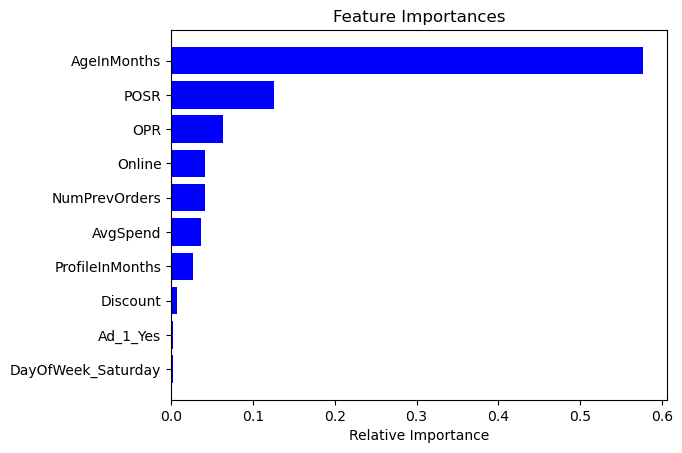

In [75]:
#Plot 
features = x.columns
importances = rfr_model.feature_importances_
indices = np.argsort(importances)[-10:]  # top 10 features
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

#### Sci-Kit Learn SelectFromModel

In [76]:
feature = SelectFromModel(RandomForestRegressor())
feature.fit(X_train, y_train)

SelectFromModel(estimator=RandomForestRegressor())

In [77]:
selected_feat= x.columns[(feature.get_support())]
len(selected_feat) 

7

In [78]:
print(selected_feat)

Index(['AgeInMonths', 'ProfileInMonths', 'NumPrevOrders', 'AvgSpend', 'POSR',
       'OPR', 'Online'],
      dtype='object')


#### Dataframes for different variable selection

In [79]:
#SciKit Learn SelectFromModel
df_3 = pd.DataFrame({"AgeInMonths": df_scaled["AgeInMonths"], 
                        "NumPrevOrders": df_scaled["NumPrevOrders"],
                       "ProfileInMonths": df_scaled["ProfileInMonths"],
                        "AvgSpend": df_scaled["AvgSpend"],
                          "POSR": df_scaled["POSR"],
                       "OPR": df_scaled["OPR"],
                       "Online": df_scaled["Online"]
                      })
                    
# Make train and test data
x3 = df_3
y3 = df_no_outliers["Sales"]

X3_train, X3_test, y3_train, y3_test = train_test_split(x3, y3, test_size=0.2, random_state = 24)

#### Choosing hyperparameter k for different varaibles selection
1 MSE of different k-values <br>
2 GridSearch

<function matplotlib.pyplot.show(close=None, block=None)>

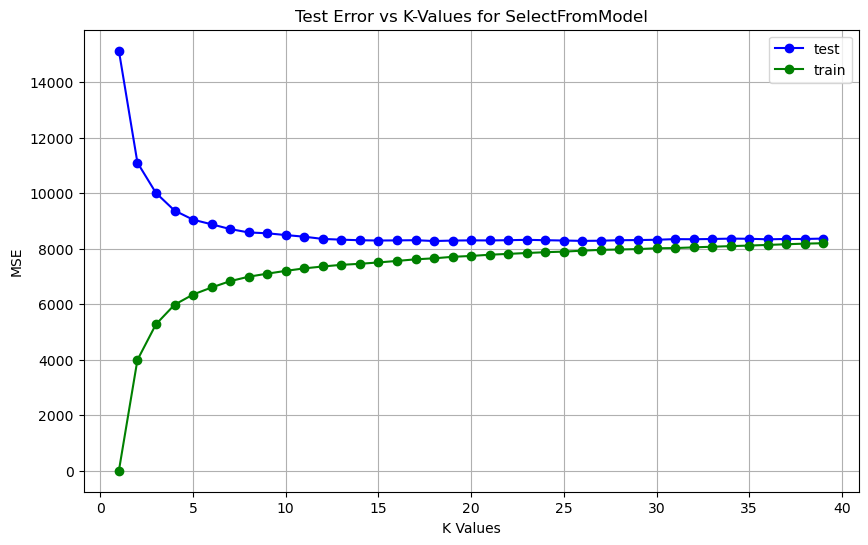

In [80]:
k_values = np.arange(1, 40)
test_errors = []
train_errors = []

for k in k_values:
    knn = KNeighborsRegressor(n_neighbors=k)
    knn.fit(X3_train, y3_train)
    
    test_pred = knn.predict(X3_test)
    train_pred = knn.predict(X3_train)
    
    test_error = mean_squared_error(y3_test, test_pred)
    test_errors.append(test_error)
    
    train_error = mean_squared_error(y3_train, train_pred)
    train_errors.append(train_error)
    
train_errors = np.array(train_errors)
test_errors = np.array(test_errors)
    
plt.figure(figsize=(10,6))
plt.plot(k_values, test_errors, marker = 'o', linestyle='-', color="blue", label="test")
plt.plot(k_values, train_errors, marker = 'o', linestyle='-', color="green", label="train")
plt.title("Test Error vs K-Values for SelectFromModel")
plt.xlabel("K Values")
plt.ylabel("MSE")
plt.legend()
plt.grid(True)
plt.show

In [81]:
parameters = {'n_neighbors': np.arange(1, 50)}
cv = GridSearchCV(KNeighborsRegressor(), param_grid=parameters, scoring = 'neg_mean_squared_error', cv = 5)
cv.fit(X3_train, y3_train)

GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])},
             scoring='neg_mean_squared_error')

In [82]:
cv.best_params_

{'n_neighbors': 23}

In [83]:
knn13 = KNeighborsRegressor(n_neighbors=23, metric = "minkowski")
knn13.fit(X3_train, y3_train)

KNeighborsRegressor(n_neighbors=23)

In [84]:
preds3 = knn13.predict(X3_test)

In [85]:
mse3 = mean_squared_error(y3_test, preds3)
mse3

8315.821721702432

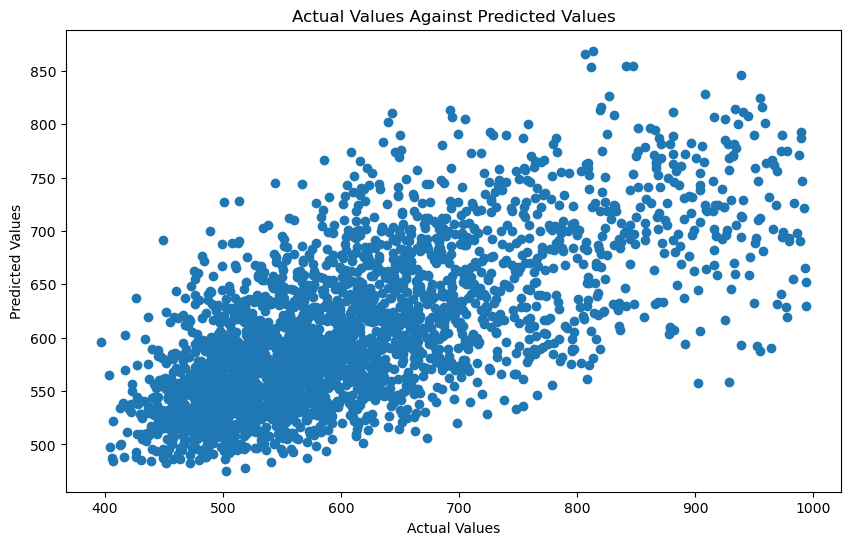

In [86]:
plt.figure(figsize=(10,6))
plt.scatter(y3_test, preds3)
plt.title("Actual Values Against Predicted Values")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.show()